![Daniel Bourke - Learn PyTorch for deep learning in a day. Literally. [Z_ikDlimN6A - 958x539 - 14h07m07s].png](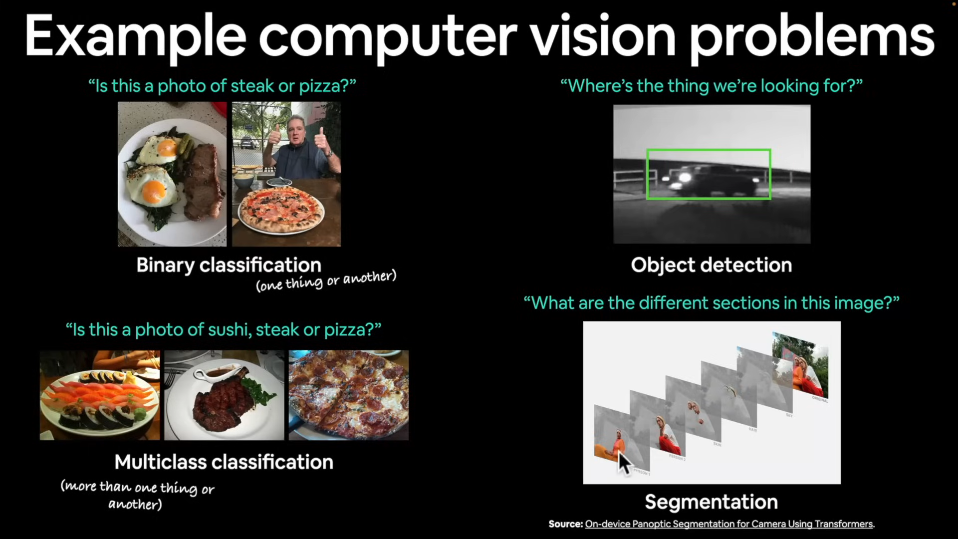)

![Daniel Bourke - Learn PyTorch for deep learning in a day. Literally. [Z_ikDlimN6A - 958x539 - 14h07m20s].png](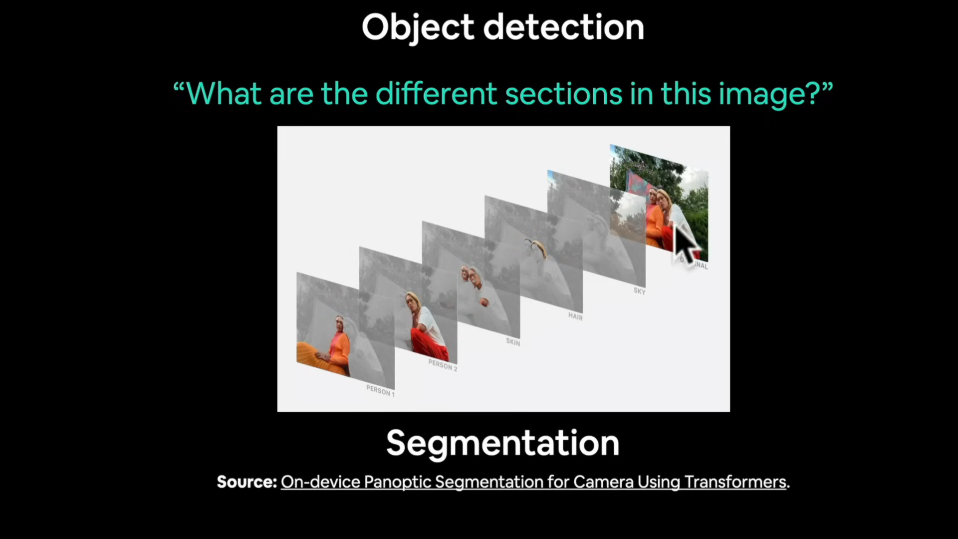)

![Daniel Bourke - Learn PyTorch for deep learning in a day. Literally. [Z_ikDlimN6A - 958x539 - 14h08m59s].png](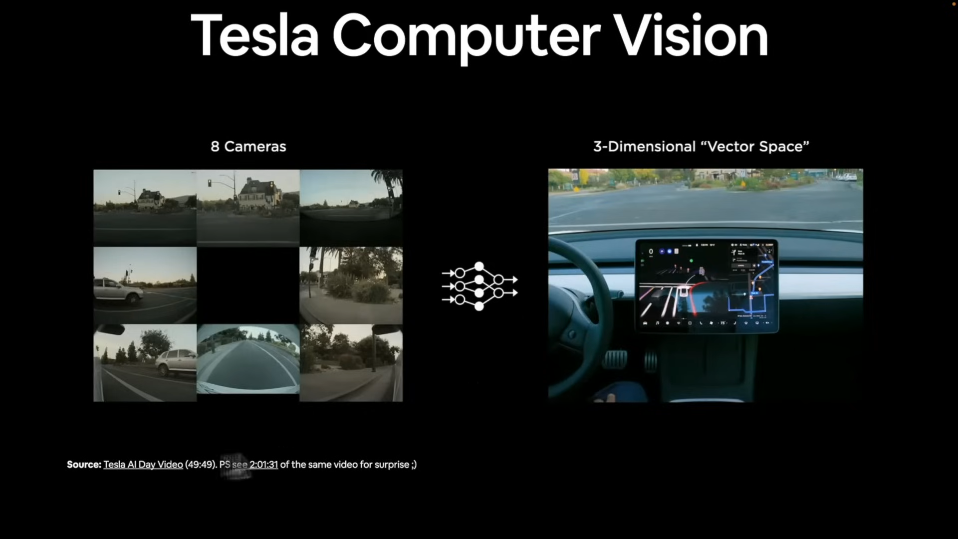)

![Daniel Bourke - Learn PyTorch for deep learning in a day. Literally. [Z_ikDlimN6A - 958x539 - 14h11m35s].png](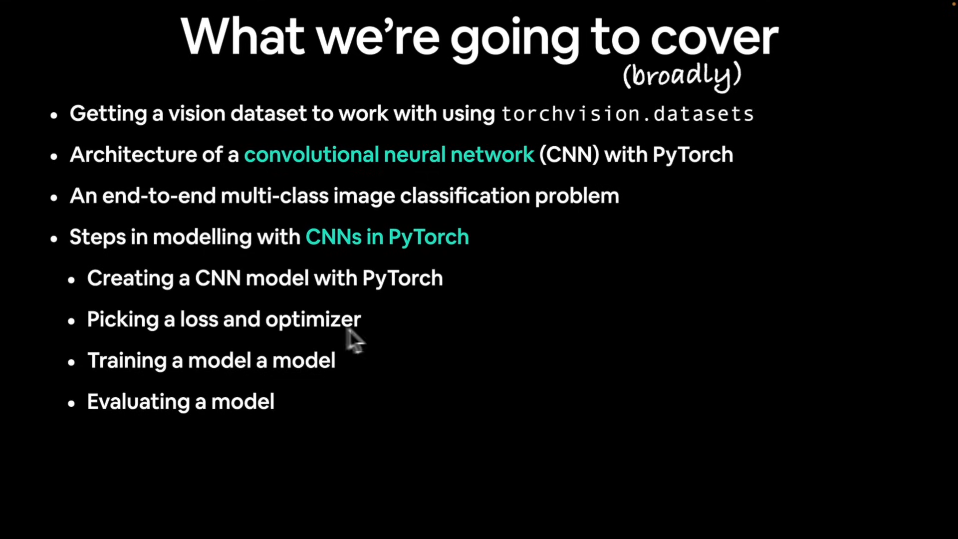)

![Daniel Bourke - Learn PyTorch for deep learning in a day. Literally. [Z_ikDlimN6A - 958x539 - 14h13m53s].png](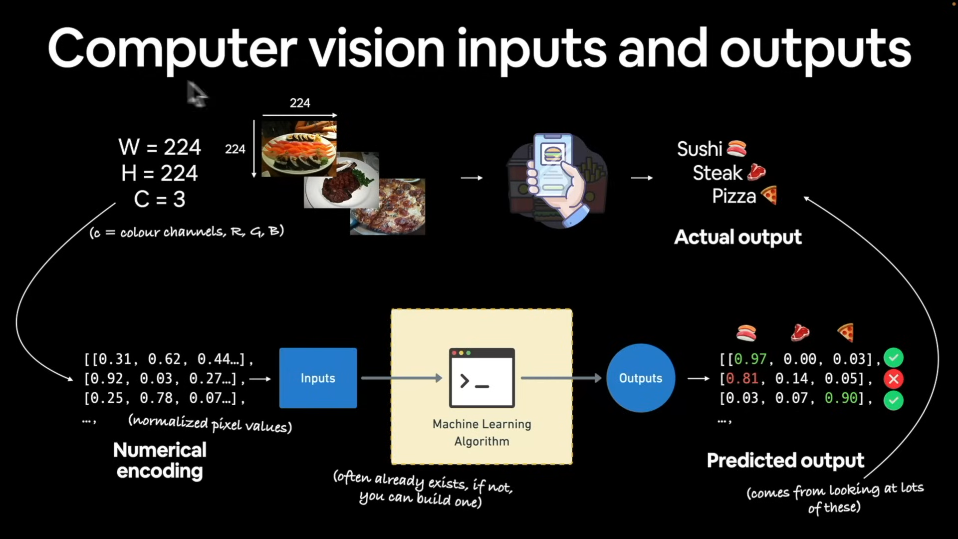)

![Daniel Bourke - Learn PyTorch for deep learning in a day. Literally. [Z_ikDlimN6A - 958x539 - 14h19m22s].png](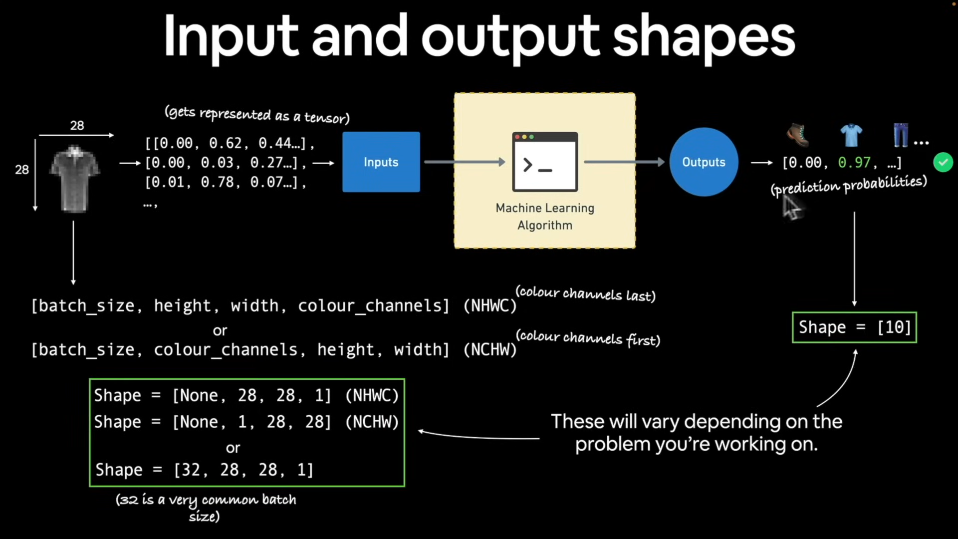)

![Daniel Bourke - Learn PyTorch for deep learning in a day. Literally. [Z_ikDlimN6A - 958x539 - 14h22m04s].png](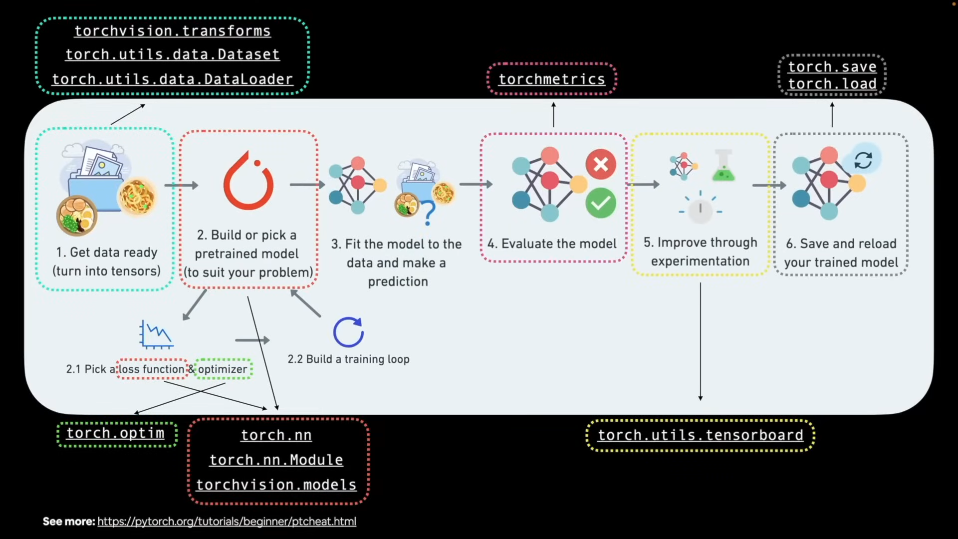)

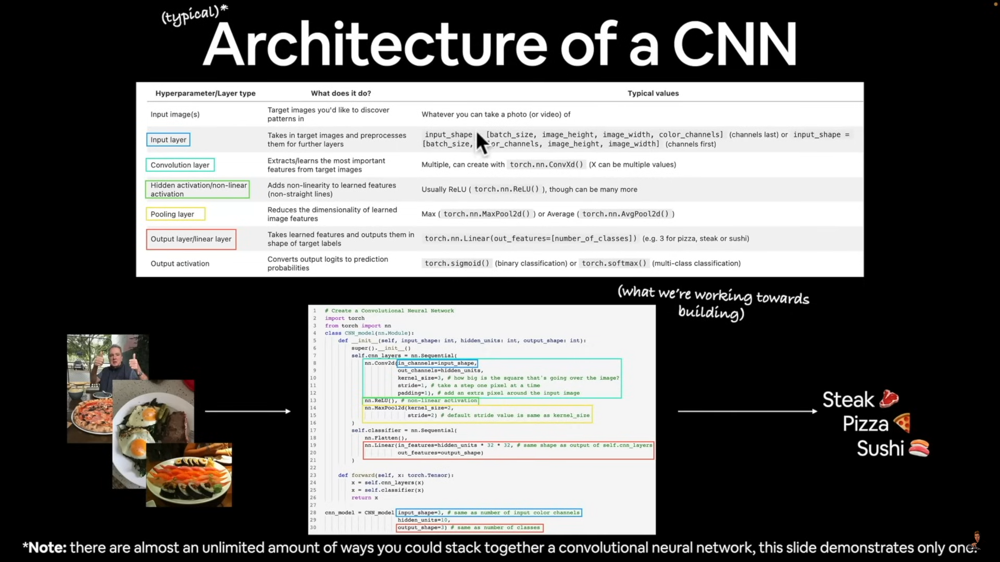

![Daniel Bourke - Learn PyTorch for deep learning in a day. Literally. [Z_ikDlimN6A - 958x539 - 14h26m27s].png](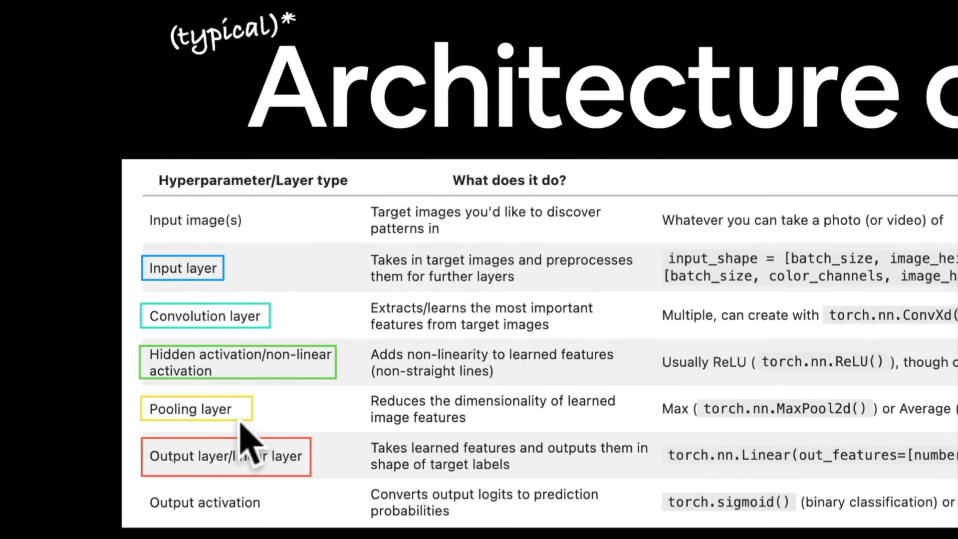)

![Daniel Bourke - Learn PyTorch for deep learning in a day. Literally. [Z_ikDlimN6A - 958x539 - 14h26m34s].png](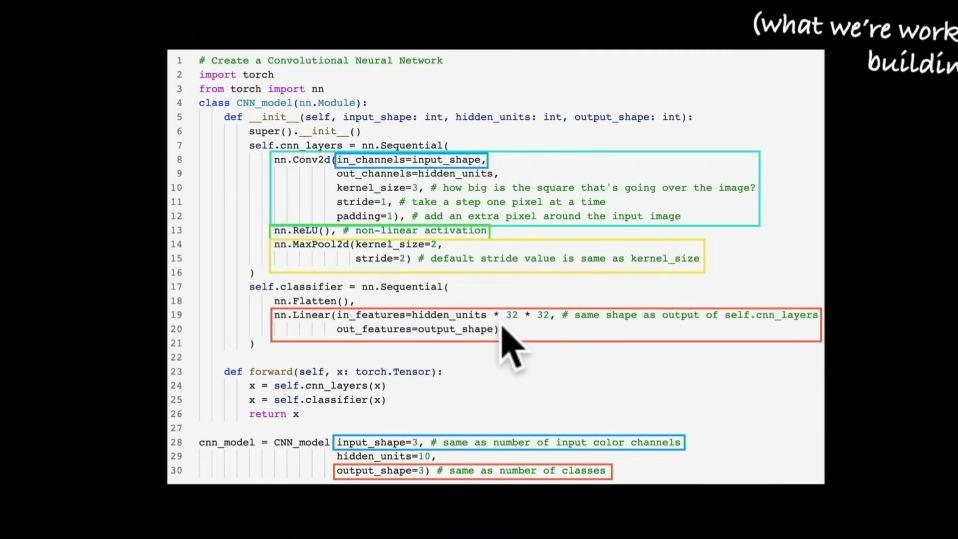)

# PyTorch Computer Vision

0. `torchvision` - base domain library fro PyTorch Computer Vision
1. `torchvision.datasets` - get datasets and data loading functions for computer vision here
2. `torchvision.models` - get pretrained computer vision models that you can leverage for your own problem
3. `torchvision.transform` - functions for manupulating you vision data(images) to be suitable for use with an ML model.
4. `torch.utils.data.Dataset` - Base dataset class fro pytorch
5. `torch.utils.data.DataLoader` - Creates a python iterable over a dataset

In [10]:
# Import PyTorch
import torch
from torch import nn

# Import torchvision
import torchvision
from torchvision import datasets
from torchvision import transforms
from torchvision.transforms import ToTensor

# Import Matplotlib for visualization
import matplotlib.pyplot as plt

# Check version
print(torch.__version__)
print(torchvision.__version__)

2.2.1+cu121
0.17.1+cu121


# 1. Getting a dataset
The dataset we will be using FashionMNIST from torchvision.datasets-
https://pytorch.org/vision/stable/generated/torchvision.datasets.FashionMNIST.html#torchvision.datasets.FashionMNIST

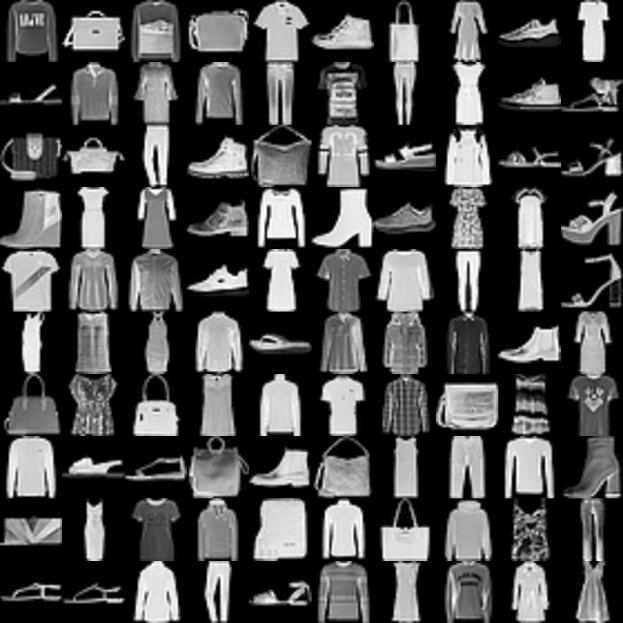

In [11]:
# Setup training data
from torchvision import datasets
train_data = datasets.FashionMNIST(
    root="data",# where to download data?
    train = True, # Do we want the training data?
    download=True, #  do we want to download yes/no?,
    transform=torchvision.transforms.ToTensor(), # how do we transform the data?
    target_transform = None # do we want to transform the labels/targets?
)

test_data = datasets.FashionMNIST(
    root = "data",
    train = False,
    download = True,
    transform = ToTensor(), # same as torchvision.transforms.ToTensor()
    target_transform = None
)

![Daniel Bourke - Learn PyTorch for deep learning in a day. Literally. [Z_ikDlimN6A - 958x539 - 14h47m50s].png](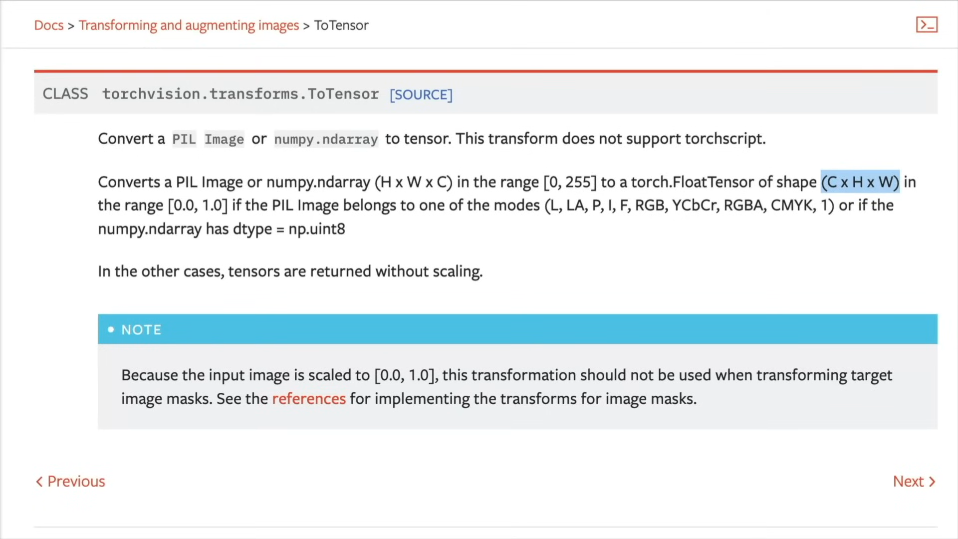)

In [12]:
len(train_data), len(test_data)

(60000, 10000)

In [13]:
# See the first training example
image, label = train_data[0]
image, label

(tensor([[[0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
           0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
           0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
           0.0000, 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
           0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
           0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
           0.0000, 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
           0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
           0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
           0.0000, 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
           0.0000, 0.0000, 0.0000, 0.0000, 0.0039, 0.0000, 0.0000, 0.0510,
           0.2863, 0.0000, 0.0000, 0.0039, 

In [14]:
class_names = train_data.classes
class_names

['T-shirt/top',
 'Trouser',
 'Pullover',
 'Dress',
 'Coat',
 'Sandal',
 'Shirt',
 'Sneaker',
 'Bag',
 'Ankle boot']

In [15]:
class_to_idx = train_data.class_to_idx
class_to_idx

{'T-shirt/top': 0,
 'Trouser': 1,
 'Pullover': 2,
 'Dress': 3,
 'Coat': 4,
 'Sandal': 5,
 'Shirt': 6,
 'Sneaker': 7,
 'Bag': 8,
 'Ankle boot': 9}

In [16]:
train_data.targets

tensor([9, 0, 0,  ..., 3, 0, 5])

In [17]:
# print the shape of our image
print(f"Image shape: {image.shape} -> [color_channels, height, width]")
print(f"Image Label: {class_names[label]}")

Image shape: torch.Size([1, 28, 28]) -> [color_channels, height, width]
Image Label: Ankle boot


Visualizing the image as Image

Image shape: torch.Size([1, 28, 28])


TypeError: Invalid shape (1, 28, 28) for image data

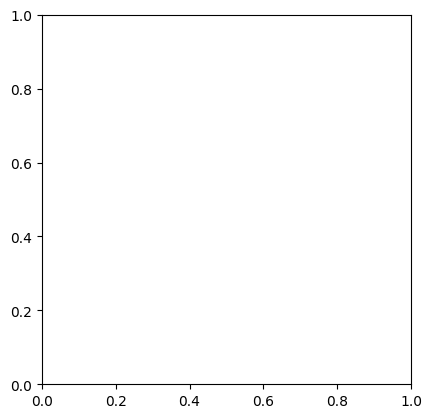

In [18]:
import matplotlib.pyplot as plt
image, label = train_data[0]

print(f"Image shape: {image.shape}")
plt.imshow(image)
image

Image shape: torch.Size([1, 28, 28])


Text(0.5, 1.0, '9')

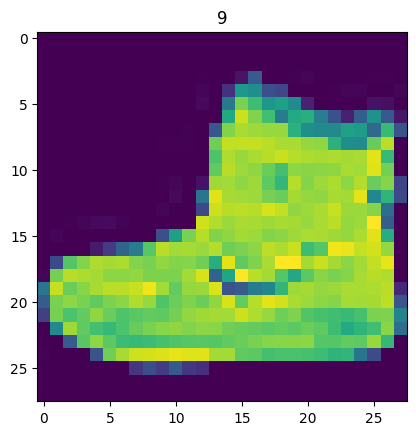

In [19]:
import matplotlib.pyplot as plt
image, label = train_data[0]

print(f"Image shape: {image.shape}")
plt.imshow(image.squeeze()) # remove the single dimension
# image
plt.title(label)

Actually it is grayscale. Because of matplotlib green dikh rha hai.

Text(0.5, 1.0, 'Ankle boot')

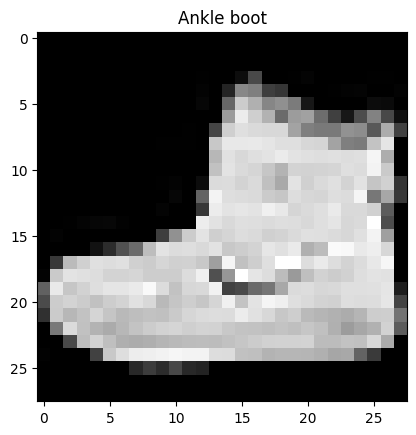

In [20]:
plt.imshow(image.squeeze(),cmap="gray")
plt.title(class_names[label])

28 x 28 ko hihgly zoom krke dekh rhe hain, hence kafi blurry/hazzy dikh rhi hai

In [21]:
# plot more images :
torch.manual_seed(42)
# fig = plt.figure(figsize=(9,9))
rows, cols = 4, 4
for i in range(rows*cols):
  random_idx = torch.randint(0, len(train_data), size=[1]).item()
  print(random_idx)

37542
46067
46876
46414
10026
27335
38620
11924
14950
57113
31378
29014
47210
18954
18231
47572


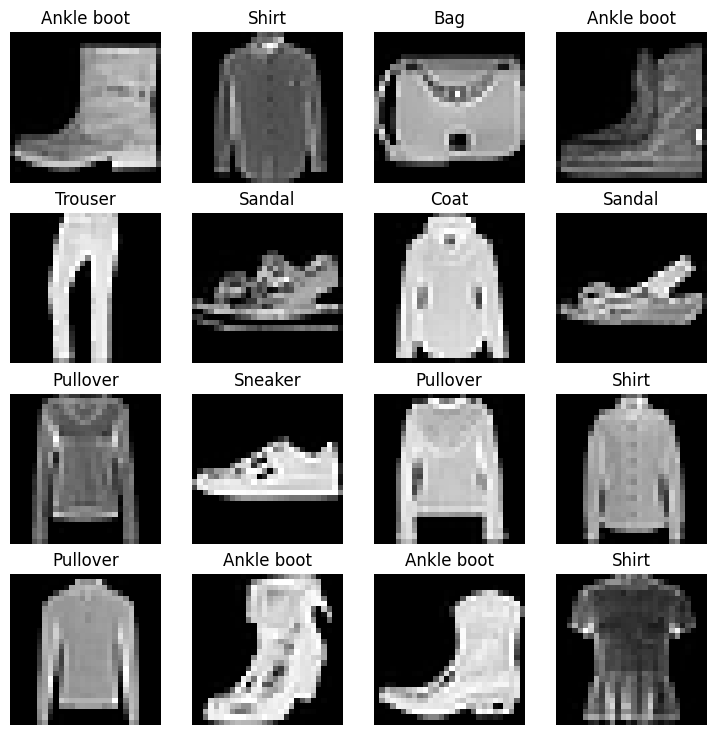

In [22]:
# plot more images :
torch.manual_seed(42)
fig = plt.figure(figsize=(9,9))
rows, cols = 4, 4
for i in range(rows*cols):
  random_idx = torch.randint(0, len(train_data), size=[1]).item()
  img, label = train_data[random_idx]
  fig.add_subplot(rows,cols,i+1) # num must be an integer with 1 <= num <= 16, not 0
  plt.imshow(img.squeeze(),cmap="gray")
  plt.title(class_names[label])
  plt.axis(False)

In [23]:
train_data, test_data

(Dataset FashionMNIST
     Number of datapoints: 60000
     Root location: data
     Split: Train
     StandardTransform
 Transform: ToTensor(),
 Dataset FashionMNIST
     Number of datapoints: 10000
     Root location: data
     Split: Test
     StandardTransform
 Transform: ToTensor())

**Dataloader Overview and mini batches**



# 2. Prepare DataLoader

Right now, our data is in the form of PyTorch Datasets

DataLoader turns our dataset into a PyTorch iterable

More specifically, we want to turn our data into batches(or mini-batches)

Why should we do this?

1. It is more computationally efficient, as in, your computing hardware may not be able to look (store in memory) at 60000 images in one hit. So we break it down to 32 images at a time (batch size of 32 images)
2. It gives our neural network more changes to update its gradient per epoch.


![Daniel Bourke - Learn PyTorch for deep learning in a day. Literally. [Z_ikDlimN6A - 958x539 - 15h08m04s].png](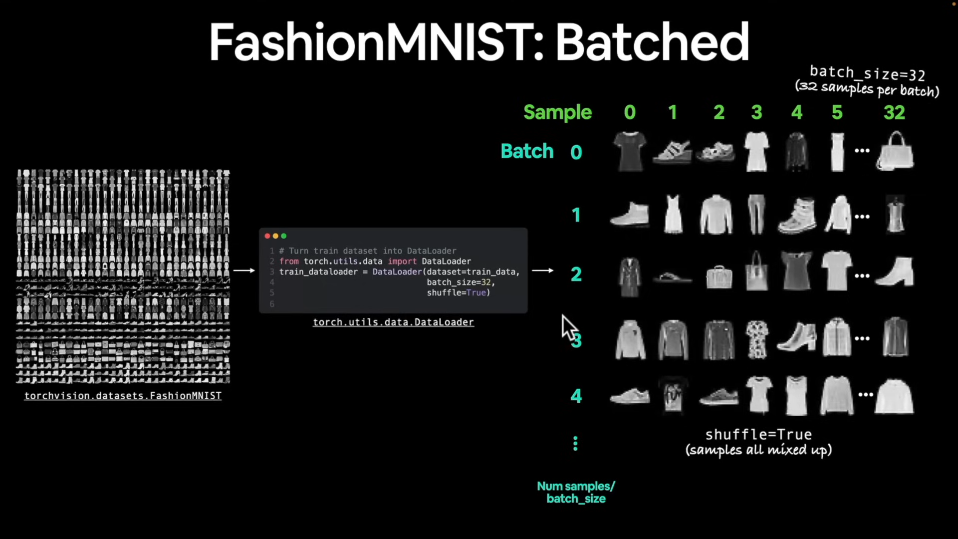)

In [24]:
from torch.utils.data import DataLoader

# Setup the batch size hyperparameter
BATCH_SIZE = 32

# Turn dataset into iterables (batches)
train_dataloader = DataLoader(dataset=train_data, batch_size=BATCH_SIZE, shuffle=True)

test_dataloader = DataLoader(dataset=test_data, batch_size=BATCH_SIZE, shuffle=False)

In [25]:
train_dataloader, test_dataloader

(<torch.utils.data.dataloader.DataLoader at 0x7eb6a8149ae0>,
 <torch.utils.data.dataloader.DataLoader at 0x7eb6a82579d0>)

In [26]:
# Let's check out what we have created
print(f"DataLoaders: {train_dataloader, test_dataloader}")

DataLoaders: (<torch.utils.data.dataloader.DataLoader object at 0x7eb6a8149ae0>, <torch.utils.data.dataloader.DataLoader object at 0x7eb6a82579d0>)


In [27]:
train_dataloader.batch_size

32

![Daniel Bourke - Learn PyTorch for deep learning in a day. Literally. [Z_ikDlimN6A - 958x539 - 15h13m51s](1).png](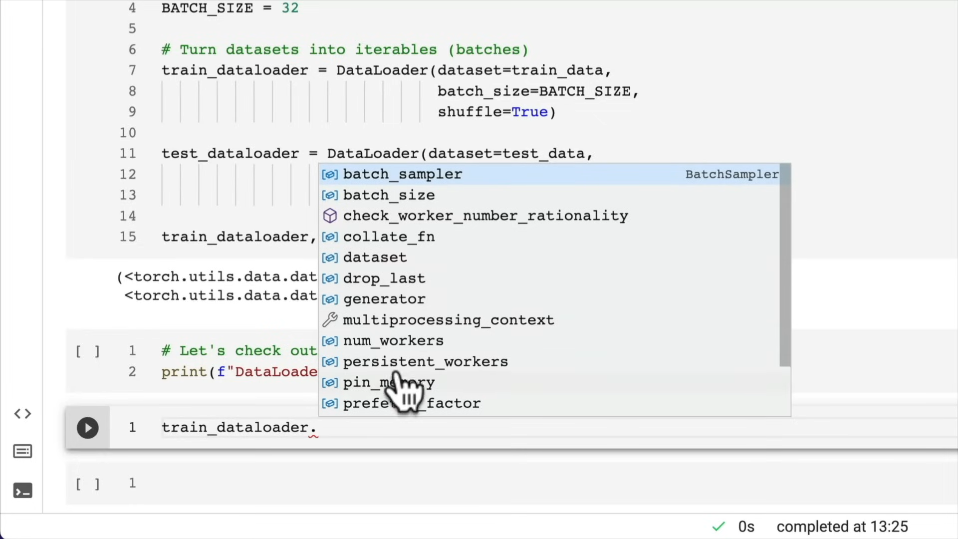)

In [28]:
print(f"Length of the train dataloader: {len(train_dataloader)} batches of {BATCH_SIZE}...")
print(f"Length of the test_dataloader: {len(test_dataloader)} batches of {BATCH_SIZE}...")

Length of the train dataloader: 1875 batches of 32...
Length of the test_dataloader: 313 batches of 32...


(Just for feeling, you can assume) Each elements of train_data_loader and test_data_loader consists of total 32 images, and corrresponding 32 labels.

Rather than 1 big batch of 60,000 samples there are total 1875 batches of 32 samples.

In [29]:
# check what is inside the training dataloader
train_features_batch, train_labels_batch = next(iter(train_dataloader)) # fetch the next batch of data from the train_dataloader.
train_features_batch.shape, train_labels_batch.shape

(torch.Size([32, 1, 28, 28]), torch.Size([32]))

In [30]:
len(train_features_batch)

32

Image size: torch.Size([1, 28, 28])
Label: 6, label size: torch.Size([])


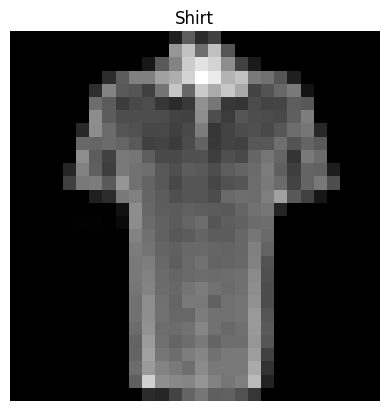

In [31]:
# Show a sample
torch.manual_seed(42)
random_idx = torch.randint(0,len(train_features_batch),size=[1]).item()
img, label = train_features_batch[random_idx], train_labels_batch[random_idx]
plt.imshow(img.squeeze(),cmap="gray")
plt.title(class_names[label])
plt.axis(False)
print(f"Image size: {img.shape}")
print(f"Label: {label}, label size: {label.shape}")

[1 28 28] = 1 channel, 28 x 28 shape of the image.

**Model_0 in Nagpur to Balharshah route. Creating a baseline with two linear layers.**

When starting to build a series of machine learning modelling experiments, it is best practicee to start with a baseline model. A baseline model is a simple model you will try and and improve opon with subsequent models/experiments. In other words, start simply and add complexity when necessary.

In [32]:
# Create a flatten layer

flatten_model = nn.Flatten()

# Getting a single sample
x = train_features_batch[0]

# Flatten the sample
output = flatten_model(x) # perform forward pass

# Print out what happened
print(f"Shape before flattening: {x.shape}") # [color channels, heeight, width]
print(f"Shape after flattening: {output.shape}") # [colour channels, height*width]

Shape before flattening: torch.Size([1, 28, 28])
Shape after flattening: torch.Size([1, 784])


In [33]:
from torch import nn
class FashionMNISTModelV0(nn.Module):
  def __init__(self,
               input_shape: int,
               hidden_units: int,
               output_shape: int
               ):
    super().__init__()
    self.layer_stack = nn.Sequential(
        nn.Flatten(),
        nn.Linear(
            in_features=input_shape,
            out_features = hidden_units
        ),
        nn.Linear(in_features=hidden_units,
                  out_features=output_shape)
    )

  def forward(self, x):
    return self.layer_stack(x)


In [34]:
torch.manual_seed(42)

# setup model with input parameters
model_0 = FashionMNISTModelV0(
    input_shape = 784, # number of units in the first hidden layer after the flattening of the 28*28 image
    hidden_units=10, # how many units in the hidden layers
    output_shape=len(class_names)  # one for every class
).to("cpu") # by default cpu pr hi hota hai

In [35]:
model_0

FashionMNISTModelV0(
  (layer_stack): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=784, out_features=10, bias=True)
    (2): Linear(in_features=10, out_features=10, bias=True)
  )
)

In [36]:
dummy_x = torch.rand([1,1,28,28])
model_0(dummy_x), model_0(dummy_x).shape

(tensor([[-0.0315,  0.3171,  0.0531, -0.2525,  0.5959,  0.2112,  0.3233,  0.2694,
          -0.1004,  0.0157]], grad_fn=<AddmmBackward0>),
 torch.Size([1, 10]))

without training, output from random weights.

In [37]:
model_0.state_dict()

OrderedDict([('layer_stack.1.weight',
              tensor([[ 0.0273,  0.0296, -0.0084,  ..., -0.0142,  0.0093,  0.0135],
                      [-0.0188, -0.0354,  0.0187,  ..., -0.0106, -0.0001,  0.0115],
                      [-0.0008,  0.0017,  0.0045,  ..., -0.0127, -0.0188,  0.0059],
                      ...,
                      [-0.0116,  0.0273, -0.0344,  ...,  0.0176,  0.0283, -0.0011],
                      [-0.0230,  0.0257,  0.0291,  ..., -0.0187, -0.0087,  0.0001],
                      [ 0.0176, -0.0147,  0.0053,  ..., -0.0336, -0.0221,  0.0205]])),
             ('layer_stack.1.bias',
              tensor([-0.0093,  0.0283, -0.0033,  0.0255,  0.0017,  0.0037, -0.0302, -0.0123,
                       0.0018,  0.0163])),
             ('layer_stack.2.weight',
              tensor([[ 0.0614, -0.0687,  0.0021,  0.2718,  0.2109,  0.1079, -0.2279, -0.1063,
                        0.2019,  0.2847],
                      [-0.1495,  0.1344, -0.0740,  0.2006, -0.0475, -0.2514, -0.

DL ka most fascinating things is : it autometically feagures out what features to learn. What are the features.

## Seetup loss, optimizer and evaluation metrics

* Loss Function - since we are woorking with multi class data, our loss function will be 'nn.CrossEntropyLoss()'
* optimizer = our optimizer `torch.optim.SGD` (Stochastic gradient descent)
* Evaluation metric : since we are working on a classification problem, let's use accuracy as our evaluation metric

In [38]:
# Calculate accuracy (a classification metric)
def accuracy_fn(y_true, y_pred):
  correct = torch.eq(y_true, y_pred).sum().item() # torch.eq() calculates where two tensors are equal
  acc = (correct/len(y_pred))*100
  return acc

In [39]:
# to import some function from another python files
import requests
from pathlib import Path

# Download helper function from learn pytorch repo
if Path("helper_functions.py").is_file():
  print("helper_function.py already exists, skipping download...")
else: # copy raw url, only; not the one first comes
  print("Downloading helper_function.py")
  request = requests.get("https://raw.githubusercontent.com/mrdbourke/pytorch-deep-learning/main/helper_functions.py")
  with open("helper_functions.py", "wb") as f:
    f.write(request.content)


It is very common when writting big codes. Put all the helper functions in some external python file, and use it.

In [40]:
# Import accuracy metric
from helper_functions import accuracy_fn

# Seetup loss function and optimizer
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(params = model_0.parameters(),lr = 0.1)

![Daniel Bourke - Learn PyTorch for deep learning in a day. Literally. [Z_ikDlimN6A - 958x539 - 15h45m35s].png](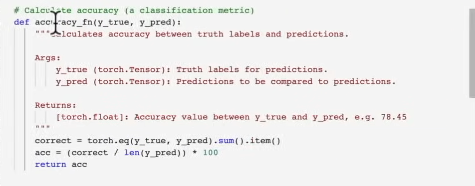)

That doc string written in the function description, is comming by default.

![Daniel Bourke - Learn PyTorch for deep learning in a day. Literally. [Z_ikDlimN6A - 958x539 - 15h45m27s].png](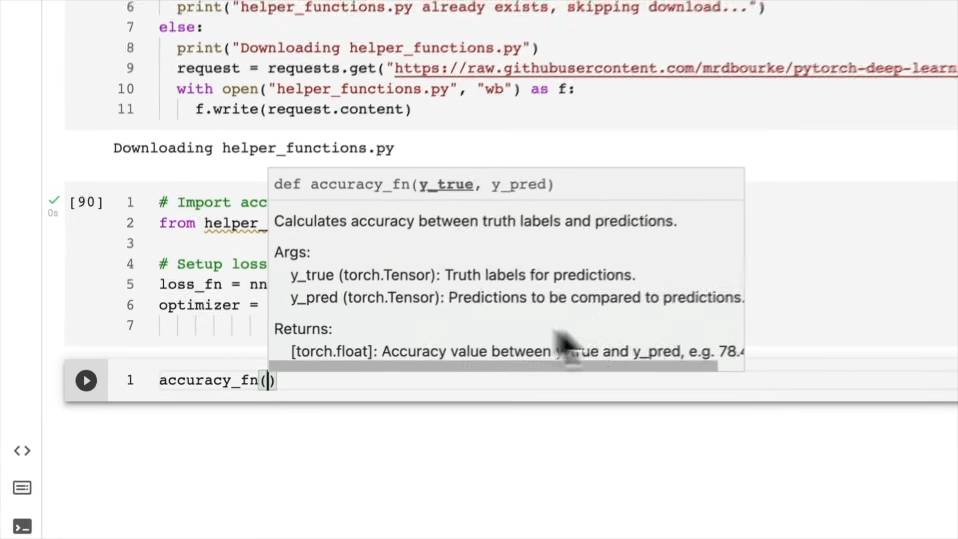)

## Creating a function to time our experiment

Machine learning is very experimental.

Two of the main things you will often want to track are:
1. Model performance (loss and accuracy values etc.)
2. How fast it runs

Gives time for execution of small code snippet.

In [41]:
from timeit import default_timer as timer
def print_train_time(start:float,
                     end:float,
                     device: torch.device = None):
  """Prints the dufference between start and end time."""
  total_time = end - start
  print(f"Train time on {device}: {total_time: .3f} seconds")
  return total_time

In [42]:
start_time = timer()
# some code
print("Hello world")
end_time = timer()
print_train_time(start_time,end_time,"cpu")

Hello world
Train time on cpu:  0.002 seconds


0.0019601680000107535

OR

In [43]:
start_time = timer()
# some code
print("Hello world")
end_time = timer()
print_train_time(start=start_time,end=end_time,device="cpu")

Hello world
Train time on cpu:  0.000 seconds


0.0002904050000154257

Creating a training loop and training a model on batches of data.

**Highlight: that the optimizer will update a model's parameters once per batch rather than once per epoch..**



1. Loop through each epochs
2. Under each epochs, loos through training batches, perform training steps, calculate the train loss per batch
3. Loop through testing batches, perform testing steps, calculate the test loss per batch.
4. Print out what's happening
5. Time it all(for fun)

In [44]:
# import tqdm for process bar
from tqdm.auto import tqdm

# set the seed and start the timer
torch.manual_seed(42)
train_time_start_on_cpu = timer()

# Set the number of epochs (we will keep this small for faster training time)
epochs = 3

# Create training and test loop
# for epoch 1, the whole model will be trained for each epochs, then for epoch 2, the whole model will be trained at each batch. And lastly for epoch 3, the whole model will be trained on each batches. Fo 3*1875 times pura loop chalega.
# That is 3*1875 times model will be updated.
for epoch in tqdm(range(epochs)): # instead of just i in range(i), use i in tqdm(range(i)) for better representation
  print(f"Epoch: {epoch}\n------")

  # training
  train_loss = 0
  # Add a loop through the training batches
  for batch, (X,y) in enumerate(train_dataloader): # training batch comes in form of (X = features of 32 images,y=labels of 32 images) that is (images, labels)
    model_0.train()
    # 1. forward pass
    y_pred = model_0(X)

    # 2. Calculate the loss per batch
    loss = loss_fn(y_pred,y) # training loss per batch it is.
    train_loss += loss # accumulate train loss

    # 3. Optimizer zero grad
    optimizer.zero_grad()

    # 4. loss backward
    loss.backward()

    # 5. Optimizer step
    optimizer.step()

# with every batch our model is hopefully getting slightly better, rather than after the whole sample(i.e. after one full epoch).
# doing without mini batches, updates the weights and biases after each epoch(full traversal of sample ke bad, beech me nhi. So in that case only 3 times model ke parameters update honge.). But 1875 batches me krne se 3*1875 times parameters will be updated
     # Print out what is happening
    if batch % 400 == 0:
      print(f"Looked at {batch*len(X)}/{len(train_dataloader.dataset)} samples.")

  # Devide total loss coming from internal for loop by the number of batches to get average loss per epoch
  train_loss /= len(train_dataloader)

  ## Testing
  test_loss, test_acc = 0, 0
  model_0.eval()
  with torch.inference_mode():
    for X_test_batch, y_test_batch in test_dataloader:
      # 1. Foward pass
      test_pred = model_0(X_test_batch)

      # 2. Calculate the loss (accumulatively)
      test_loss += loss_fn(test_pred, y_test_batch)

      # 3. Calculate Accuracy
      test_acc += accuracy_fn(y_true=y_test_batch, y_pred=test_pred.argmax(dim=1))

    # calculate the test loss average per batch
    test_loss /= len(test_dataloader)

    # Calculate test accuracy average per batch
    test_acc /= len(test_dataloader)

  # Print out what is happening
  print(f"\nTrain Loss: {train_loss:.4f} | Test_loss: {test_loss:.4f}, Test_acc: {test_acc:.4f}")

# Calculate training time
train_time_end_on_cpu = timer()
total_train_time_model_0 = print_train_time(train_time_start_on_cpu,train_time_end_on_cpu, device=str(next(model_0.parameters()).device) )


  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 0
------
Looked at 0/60000 samples.
Looked at 12800/60000 samples.
Looked at 25600/60000 samples.
Looked at 38400/60000 samples.
Looked at 51200/60000 samples.

Train Loss: 0.5904 | Test_loss: 0.5095, Test_acc: 82.0387
Epoch: 1
------
Looked at 0/60000 samples.
Looked at 12800/60000 samples.
Looked at 25600/60000 samples.
Looked at 38400/60000 samples.
Looked at 51200/60000 samples.

Train Loss: 0.4763 | Test_loss: 0.4799, Test_acc: 83.1969
Epoch: 2
------
Looked at 0/60000 samples.
Looked at 12800/60000 samples.
Looked at 25600/60000 samples.
Looked at 38400/60000 samples.
Looked at 51200/60000 samples.

Train Loss: 0.4550 | Test_loss: 0.4766, Test_acc: 83.4265
Train time on cpu:  37.380 seconds


In [45]:
next(model_0.parameters())

Parameter containing:
tensor([[ 0.0273,  0.0298, -0.0065,  ...,  0.0071,  0.0091,  0.0170],
        [-0.0189, -0.0355,  0.0155,  ...,  0.0161,  0.0120,  0.0117],
        [-0.0008,  0.0020,  0.0032,  ...,  0.0058, -0.0146,  0.0084],
        ...,
        [-0.0116,  0.0274, -0.0323,  ...,  0.0527,  0.0434,  0.0006],
        [-0.0231,  0.0252,  0.0236,  ..., -0.0892, -0.0385, -0.0071],
        [ 0.0175, -0.0148,  0.0027,  ..., -0.1155, -0.0674,  0.0125]],
       requires_grad=True)

In [46]:
next(model_0.parameters()).device

device(type='cpu')

In [47]:
str(next(model_0.parameters()).device)

'cpu'

In [48]:
# 4. Make predictions, Evaluate our model and get model 0 results.

torch.manual_seed(42)
def eval_model(model : torch.nn.Module,
               data_loader: torch.utils.data.DataLoader,
               loss_fn: torch.nn.Module,
               accuracy_fn):
  """Returns a disctionary containing the results of model predicting on data_loader."""
  loss, acc = 0 , 0
  model.eval()
  with torch.inference_mode():
    for X, y in tqdm(data_loader):
      # make predictions
      y_pred = model(X)

      # Acuumulate the loss and acc values per batch
      loss += loss_fn(y_pred, y)
      acc += accuracy_fn(y_true=y, y_pred=y_pred.argmax(dim=1))

    # Scale loss and acc to find the average loss/acc per batch
    loss /= len(data_loader)
    acc /= len(data_loader)

  return {"model_name": model.__class__.__name__, # only works when model was created with a class
          'model_loss': loss.item(),
          'model_acc':acc}

# calculate model 0 result on test dataset
model_0_results = eval_model(model=model_0,
                               data_loader=test_dataloader,
                               loss_fn=loss_fn,
                               accuracy_fn=accuracy_fn)

model_0_results


  0%|          | 0/313 [00:00<?, ?it/s]

{'model_name': 'FashionMNISTModelV0',
 'model_loss': 0.47663894295692444,
 'model_acc': 83.42651757188499}

`model.__class__.__name__` is a Python expression used to obtain the name of the class of an object. Let's break it down:

- `model`: This is an instance of a class in Python.
- `__class__`: This is a special attribute in Python that refers to the class of an object.
- `__name__`: This is a special attribute of classes in Python that returns the name of the class as a string.

So, `model.__class__.__name__` essentially retrieves the name of the class of the `model` object.

For example, if you have a class named `FashionMNISTModelV0`, and you create an instance of it called `model_0`, `model_0.__class__.__name__` will return the string `'FashionMNISTModelV0'`.

In the context of your code snippet, `model.__class__.__name__` is used to obtain the name of the class of the `model` object. This can be useful for logging or recording the name of the model being evaluated.

# Improving through experimentation

In [49]:
# setup device agnostic code : although I am not gonna use GPU, still the code will work for both cpu and gpu.

In [50]:
!nvidia-smi

/bin/bash: line 1: nvidia-smi: command not found


In [51]:
torch.cuda.is_available()

False

In [52]:
import torch
device = "cuda" if torch.cuda.is_available() else "cpu"

In [53]:
device

'cpu'

Since I am working on normal runtime. I did'nt changed it to gpu run-time.

Let's add non-linearity and see how it performs. Will the accuracy increase or not?

**Model_1 : Building a better model with non-linearity.**

We learnt about the power of non-linearity in out circle-model.

But it is quite clear, that without non-linearity, the model is performing too good.(85% accuracy)

In [54]:
from torch import nn
# classes are are flexible as functions
class FashionMNISTModelV1(nn.Module):
  def __init__(self,input_shape: int,hidden_units: int,output_shape: int):
    super().__init__()
    self.layer_stack = nn.Sequential(
        nn.Flatten(),
        nn.Linear( in_features=input_shape,out_features = hidden_units),
        nn.ReLU(),
        nn.Linear(in_features=hidden_units,out_features=output_shape),
        nn.ReLU()
    )

  def forward(self, x):
    return self.layer_stack(x)

In [55]:
# create an instance of model_1
torch.manual_seed(42)
model_1 = FashionMNISTModelV1(784, 10, 10).to(device) # send to gpu if it is available

# check model_!'s device
next(model_1.parameters()).device

device(type='cpu')

Setup loss, optimizer and evaluation metrics

In [56]:
from helper_functions import accuracy_fn
loss_fn = nn.CrossEntropyLoss() # measure how wrong our model is
optimizer = torch.optim.SGD(params=model_1.parameters(),lr=0.1) # tries to update our model's parameters to reduce the loss

Next training and testing loops

# Functionizing training and evaluation/testing loops

Let's create a function for:
* training loop - `train_step()`
* testing loop - `test_step()`

The expression `y_pred = y_pred.argmax(dim=1)` is used to obtain the index of the maximum value along the specified dimension `dim=1` in the tensor `y_pred`.

Here's what it does:

- `y_pred`: This represents the output predictions generated by the model. It's typically a tensor where each row corresponds to a sample, and each column corresponds to a class. **Each row(that is a sample of test data) me 10-10 values hongi, since total 10 classes hain. Each of the 10 values in a row corresponds to the prediction scores of that sample towards that corresponding class labels. So argmax will just keep the maximum value vala column for each sample(row), and y_pred.argmax(dim=1) returns the index of maximum probability ki class for that particular sample, for all the samples/rows.**

- `.argmax(dim=1)`: This method of the tensor `y_pred` finds the index of the maximum value along dimension 1, which is the class dimension. This effectively converts the output predictions from probability scores to class indices, indicating the predicted class for each sample.

For example, consider `y_pred` as a tensor of shape `(batch_size, num_classes)`, where `batch_size` is the number of samples in the batch, and `num_classes` is the number of classes. After applying `.argmax(dim=1)`, `y_pred` will be a tensor of shape `(batch_size,)`, containing the predicted class indices for each sample in the batch.

This operation is commonly used in classification tasks to convert model outputs (probabilities) into predicted class labels.

In [57]:
def train_step(model: torch.nn.Module,
               data_loader: torch.utils.data.DataLoader,
               loss_fn: torch.nn.Module,
               optimizer: torch.optim.Optimizer,
               accuracy_fn,
               device: torch.device=device):
  """performs a training with model trying to learn on data_loader"""
  train_loss, train_acc = 0, 0

  # put the model into training mode
  model.train()

  # Add a loop through the training batches
  for batch, (X,y) in enumerate(data_loader):
    # Put the data on target device
    X, y = X.to(device), y.to(device)

    # 1. Forward pass : output the raw logits from the model
    y_pred = model(X)

    # 2. calculate loss and accuracy per batch
    loss = loss_fn(y_pred, y)
    train_loss += loss # accumulate train loss
    train_acc += accuracy_fn(y_true=y, y_pred=y_pred.argmax(dim=1)) # go from logits to prediction labels

    # 3. Optimizer zero grad
    optimizer.zero_grad()

    # 4. loss backward
    loss.backward()

    # 5. optimizer step (update the model's parameter once per batch)
    optimizer.step()

    # Print out what is happening
    if batch % 400 == 0:
      print(f"Looked at {batch*len(X)}/{len(data_loader.dataset)} samples.") # remember it is not division, it is just string since {} nhi lga variable ke age

  # devide total train loss and accuracy by length of the dataloader(i.e. the number of batches) to get avegage loss and average accuracy per batch
  train_loss /= len(data_loader)
  train_acc /= len(data_loader)
  print(f"Train loss: {train_loss:.5f} | Train acc: {train_acc:.2f} %")


In [58]:
def test_step(model:torch.nn.Module,
              data_loader: torch.utils.data.DataLoader,
              loss_fn: torch.nn.Module,
              accuracy_fn,
              device: torch.device=device):
  """Perform a testing loop step on the model going over data_loader"""
  test_loss, test_acc = 0, 0

  # Put the model in eval mode
  model.eval()

  # Turn on inference mode context manager
  with torch.inference_mode():
    for X_test, y_test in data_loader:
      # send data to the target device
      X_test, y_test = X_test.to(device), y_test.to(device)

      # 1. Forward pass
      test_pred = model(X_test)

      # 2. calculate the loss/acc
      test_loss += loss_fn(test_pred, y_test)
      test_acc += accuracy_fn(y_true=y_test, y_pred=test_pred.argmax(dim=1)) # go from logits to prediction labels

    # Adjust metrics and print out
    test_loss /= len(data_loader) # avg test loss per batch
    test_acc /= len(data_loader) # avg test accuracy per batch
    print(f"Test loss: {test_loss:.5f} | test acc : {test_acc:.2f} % \n")



We will use these two functions train_step and test_step functions in the main code of 3 epochs.

In [59]:
torch.manual_seed(42)

# Measure time
from timeit import default_timer as timer
train_time_start_on_gpu = timer() # although using cpu, bs likha gpu hai

# set epochs
epochs = 3

# create a optimization and evaluation loop using train_step() and test_step()
for epoch in tqdm(range(epochs)):
  print(f"Epoch: {epoch}\n--------")

  train_step(model=model_1,
             data_loader=train_dataloader,
             loss_fn=loss_fn,
             optimizer=optimizer,
             accuracy_fn=accuracy_fn,
             device=device )

  test_step(model = model_1,
            data_loader=test_dataloader,
            loss_fn=loss_fn,
            accuracy_fn=accuracy_fn,
            device=device
            )
  # whole optimization loop in few(idealy 2) lines of code...

train_time_end_on_gpu = timer() # although using cpu, bs likha gpu hai
total_train_time_model_1 = print_train_time(start=train_time_start_on_gpu,
                                            end = train_time_end_on_gpu,
                                            device=device)

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 0
--------
Looked at 0/60000 samples.
Looked at 12800/60000 samples.
Looked at 25600/60000 samples.
Looked at 38400/60000 samples.
Looked at 51200/60000 samples.
Train loss: 1.09199 | Train acc: 61.34 %
Test loss: 0.95636 | test acc : 65.00 % 

Epoch: 1
--------
Looked at 0/60000 samples.
Looked at 12800/60000 samples.
Looked at 25600/60000 samples.
Looked at 38400/60000 samples.
Looked at 51200/60000 samples.
Train loss: 0.78101 | Train acc: 71.93 %
Test loss: 0.72227 | test acc : 73.91 % 

Epoch: 2
--------
Looked at 0/60000 samples.
Looked at 12800/60000 samples.
Looked at 25600/60000 samples.
Looked at 38400/60000 samples.
Looked at 51200/60000 samples.
Train loss: 0.67027 | Train acc: 75.94 %
Test loss: 0.68500 | test acc : 75.02 % 

Train time on cpu:  42.688 seconds


**Accuracy to ghat gyi. Ye jadu kaise ho gya?? Non linear layer dalne se??**

In [60]:
model_0_results

{'model_name': 'FashionMNISTModelV0',
 'model_loss': 0.47663894295692444,
 'model_acc': 83.42651757188499}

In [61]:
total_train_time_model_0

37.380006834

**NOTE**: Sometimes, depending on your data/hardware you might find that your model trains faster on CPU than GPU.

Why is this?

* It could be that the overhead for **copying data/model to and from the GPU** outweights the compute benefits offered by the GPU.
* The hardware you are using has a better CPU in terms of compute capability than the GPU.

In [62]:
# Get model 1 results dictionary
model_1_results = eval_model(model=model_1,
                             data_loader=test_dataloader,
                             loss_fn = loss_fn,
                             accuracy_fn=accuracy_fn
                             )
model_1_results

  0%|          | 0/313 [00:00<?, ?it/s]

{'model_name': 'FashionMNISTModelV1',
 'model_loss': 0.6850009560585022,
 'model_acc': 75.01996805111821}

Agar ye gpu pr hota abhi , to error aa gyi hoti : 2 device error: . To resolve that error, use modified eval_model function.

In [63]:
# 4. Make predictions, Evaluate our model and get model 0 results.

torch.manual_seed(42)
def eval_model(model : torch.nn.Module,
               data_loader: torch.utils.data.DataLoader,
               loss_fn: torch.nn.Module,
               accuracy_fn,
               device=device): ## extra added
  """Returns a disctionary containing the results of model predicting on data_loader."""
  loss, acc = 0 , 0
  model.eval()
  with torch.inference_mode():
    for X, y in tqdm(data_loader):
      # Make our data device agnostic # extra added
      X,y = X.to(device), y.to(device) # extra added

      # make predictions
      y_pred = model(X)

      # Acuumulate the loss and acc values per batch
      loss += loss_fn(y_pred, y)
      acc += accuracy_fn(y_true=y, y_pred=y_pred.argmax(dim=1))

    # Scale loss and acc to find the average loss/acc per batch
    loss /= len(data_loader)
    acc /= len(data_loader)

  return {"model_name": model.__class__.__name__, # only works when model was created with a class
          'model_loss': loss.item(),
          'model_acc':acc}


# calculate model 0 result on test dataset
model_1_results = eval_model(model=model_1,
                               data_loader=test_dataloader,
                               loss_fn=loss_fn,
                               accuracy_fn=accuracy_fn,
                               device = device)

model_1_results

  0%|          | 0/313 [00:00<?, ?it/s]

{'model_name': 'FashionMNISTModelV1',
 'model_loss': 0.6850009560585022,
 'model_acc': 75.01996805111821}

## Model 2 : Building a convolutional neural network (CNN)

CNN's are also know ConvNets.

CNN's are known for their capabilities to find pattern in visual data.

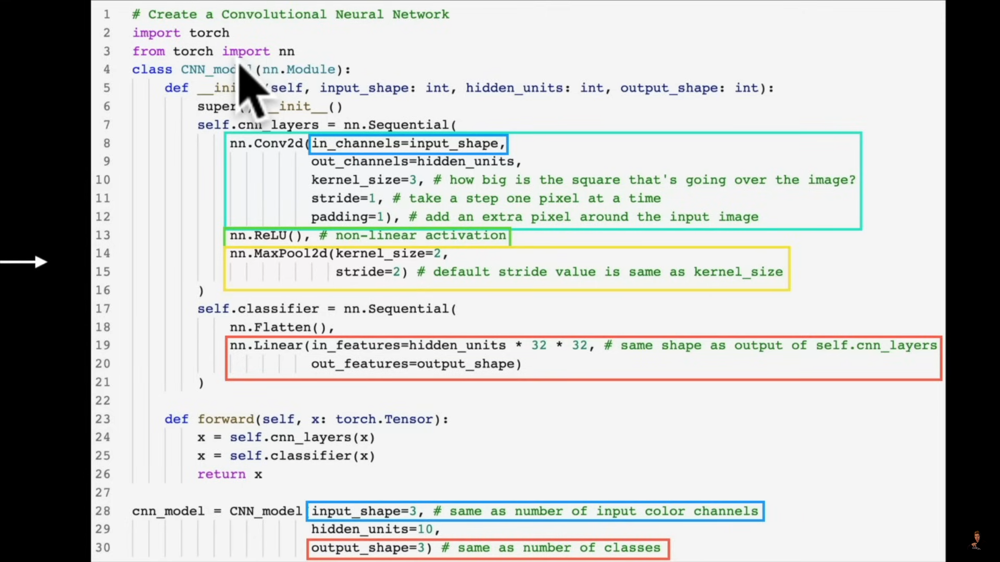

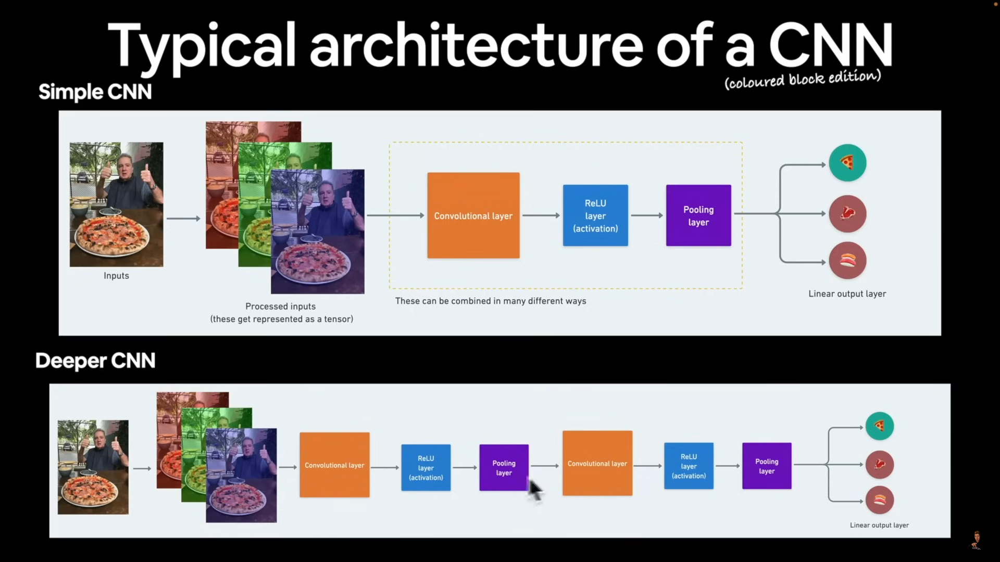

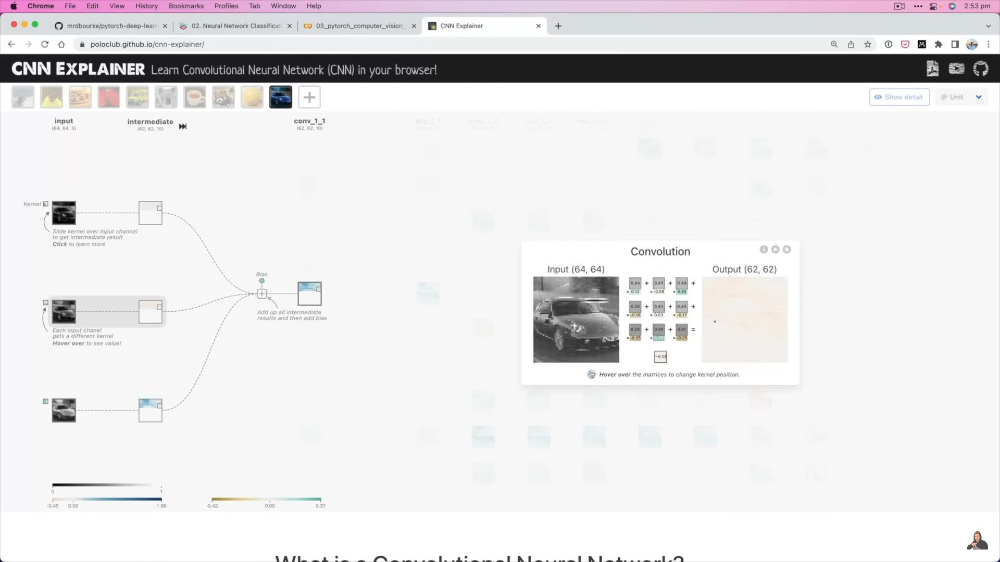

![Daniel Bourke - Learn PyTorch for deep learning in a day. Literally. [Z_ikDlimN6A - 958x539 - 17h17m29s].png](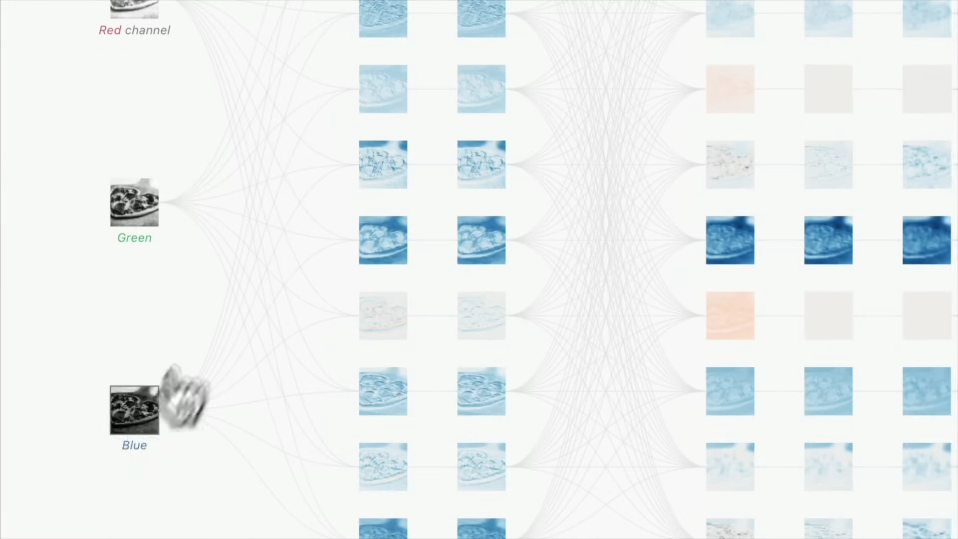)

Number of nodes in a layer in CNN = number of learnt features.

Which feature to be learnt, is decided by dl model itself. We don't need to tell anything.

eg 3*3 kernal/filter is there to find different patterns in the image. This kernal does the convolution i.e. jacobian product with the pixel values, to provide some effects to the original image like blurring effect.

![Daniel Bourke - Learn PyTorch for deep learning in a day. Literally. [Z_ikDlimN6A - 958x539 - 17h18m23s].png](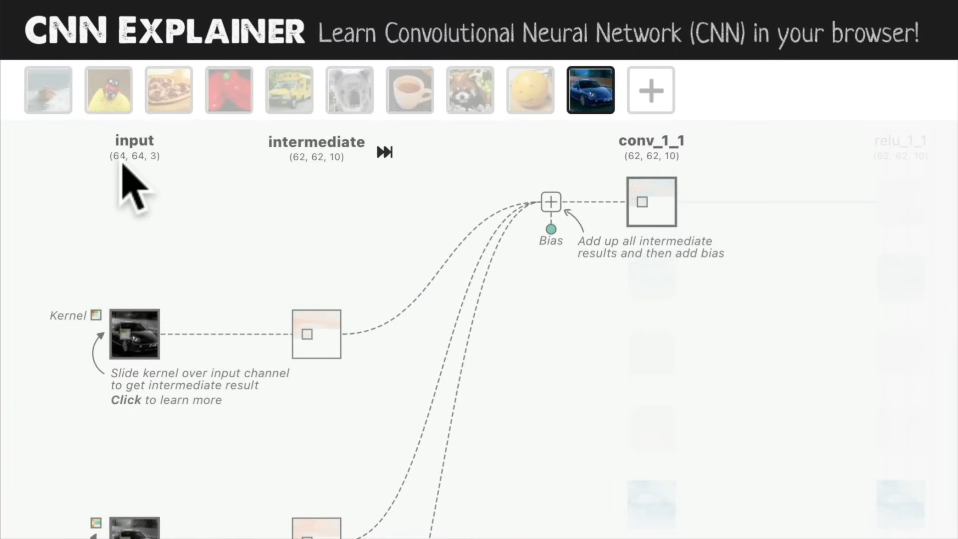)

![Daniel Bourke - Learn PyTorch for deep learning in a day. Literally. [Z_ikDlimN6A - 958x539 - 17h18m54s].png](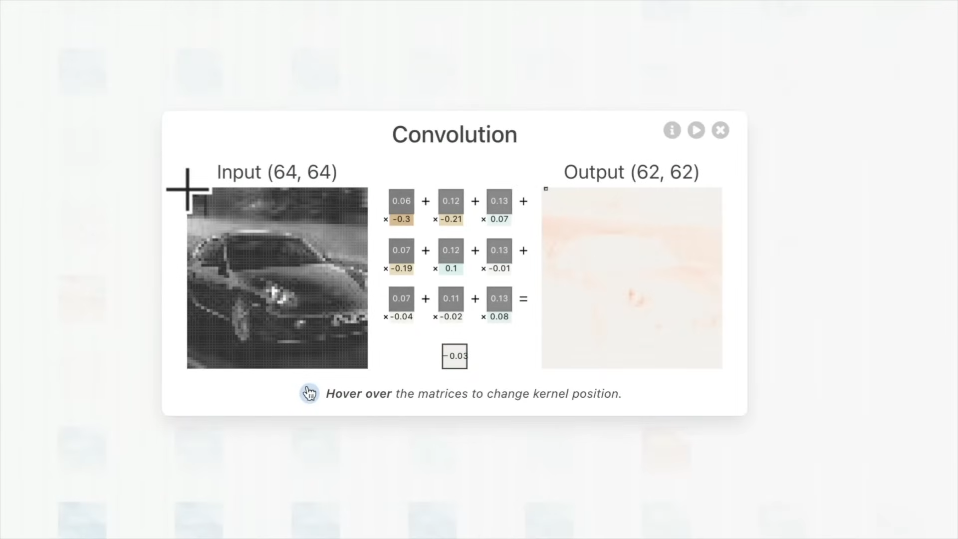)

![Daniel Bourke - Learn PyTorch for deep learning in a day. Literally. [Z_ikDlimN6A - 958x539 - 17h20m47s].png](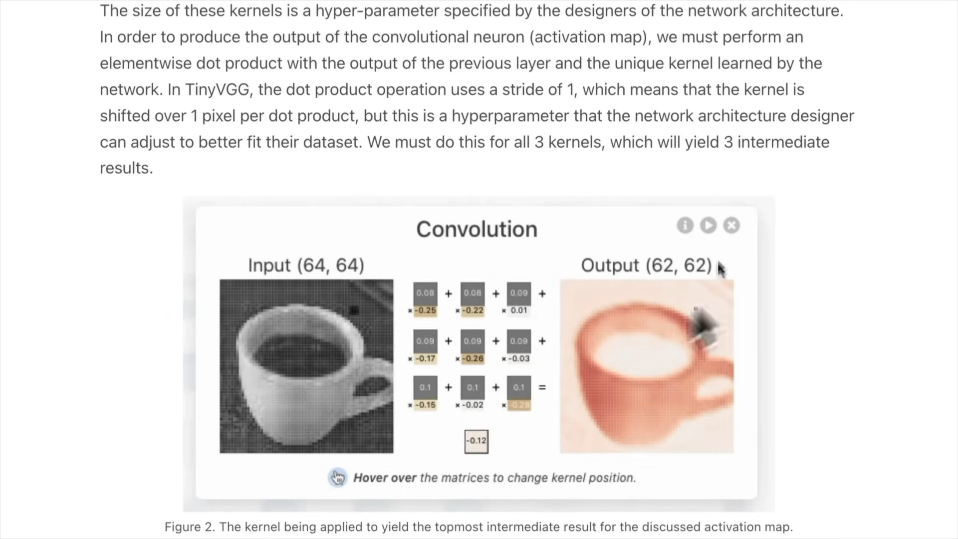)

Wee are going to built the following Block

![Daniel Bourke - Learn PyTorch for deep learning in a day. Literally. [Z_ikDlimN6A - 958x539 - 17h34m06s].png](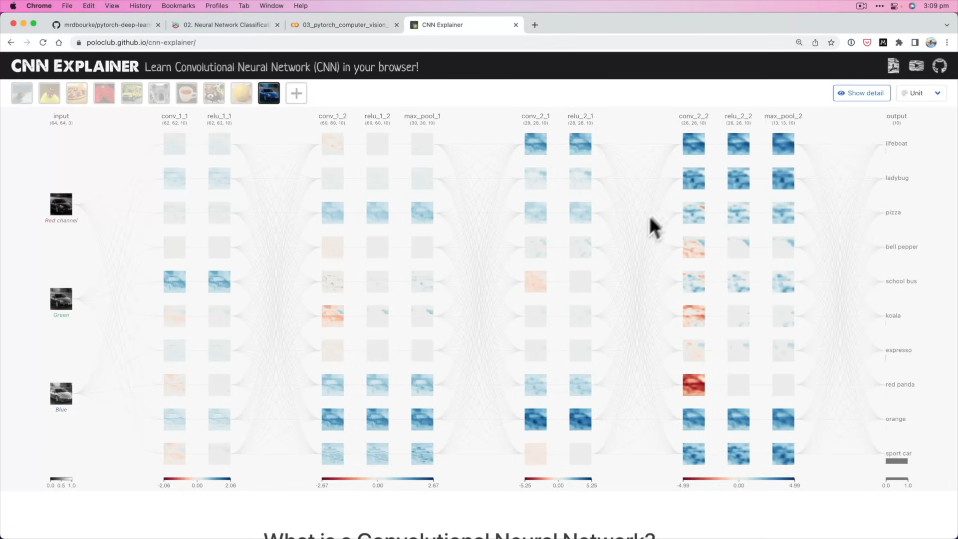)

(conv->relu) -- (conv->relu->max) -- (conv->relu) -- (conv->relu->max).

Replicating cnn explainer website.

In [64]:
import torch
from torch import nn

# Create a convolutional neural network
class FashionMNISTModelV2(nn.Module):
  """
  Model architecture that replicates the TinyVGG
  Model from CNN explainer website.
  """
  def __init__(self, input_shape:int, hidden_units:int,output_shape:int):
    super().__init__()
    self.conv_block_1 = nn.Sequential(
        # create a conv2d layer
        nn.Conv2d(in_channels=input_shape,
                  out_channels=hidden_units,
                  kernel_size=3,
                  stride=1,
                  padding=1), # HYPERPARAMETERS : All of them
        nn.ReLU(),
        nn.Conv2d(in_channels=hidden_units,
                  out_channels=hidden_units,
                  kernel_size=3,
                  stride=1,
                  padding=1),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=2) # 2*2 max pool => 60*60 image will become 30*30 image
    )
    self.conv_block_2 = nn.Sequential(
        nn.Conv2d(in_channels=hidden_units,
                  out_channels=hidden_units,
                  kernel_size=3,
                  stride=1,
                  padding=1),
        nn.ReLU(),
        nn.Conv2d(in_channels=hidden_units,
                  out_channels=hidden_units,
                  kernel_size=3,
                  stride=1,
                  padding=1),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=2)
    )

    ## So these above convolutional layers with pooling layers are kind of feature extraction layers and trying to learn the patterns that best represent the data.

    # Now classification layers
    self.classifier = nn.Sequential(
        nn.Flatten(),
        nn.Linear(in_features=hidden_units*0, # there is a trick to calculate this
                  out_features=output_shape)
    )

  def forward(self, x):
    x = self.conv_block_1(x)
    print(x.shape)
    x = self.conv_block_2(x)
    print(x.shape)
    x = self.classifier(x)
    return x

Feeling of convolution step. Assume stride = 1 i.e. 1 step movement of kernel. and padding = 0 , i.e. no outer layer is added for any of the edge.

Of course! Let's break down the calculation for each element of the output feature map. We'll perform the convolution operation step by step and compute the result for each position.

### Input Image:
```
[1, 2, 3]
[4, 5, 6]
[7, 8, 9]
```

### Convolutional Kernel:
```
[0.1, 0.2]
[0.3, 0.4]
```

### Convolution Operation:

1. **Top-Left Position:**
   ```
   (1*0.1) + (2*0.2) + (4*0.3) + (5*0.4) = 3.4
   ```
   This is the value for the top-left element of the output feature map.

2. **Top-Center Position:**
   ```
   (2*0.1) + (3*0.2) + (5*0.3) + (6*0.4) = 5.6
   ```
   This is the value for the top-center element of the output feature map.

3. **Middle-Left Position:**
   ```
   (4*0.1) + (5*0.2) + (7*0.3) + (8*0.4) = 8.2
   ```
   This is the value for the middle-left element of the output feature map.

4. **Middle-Center Position:**
   ```
   (5*0.1) + (6*0.2) + (8*0.3) + (9*0.4) = 12.4
   ```
   This is the value for the middle-center element of the output feature map.

### Output Feature Map:
```
3.4  5.6
8.2  12.4
```

This breakdown provides a detailed calculation for each element of the output feature map obtained through the convolution operation between the input image and the kernel. Each element represents the result of applying the kernel to a local region of the input image.

Assume, padding = 1, that means one outer layer of all 0 is added at each of the 4 edges.

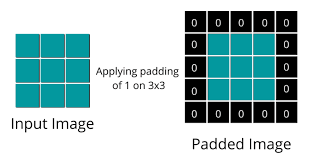



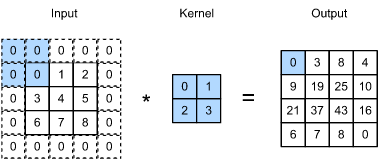

See stride 1 use krne pr, output feature map ki dimension ghtne ki jagah badh jati hai. And stride > 1 use krne pr, output feature map ki dimension ghategi. K/a downsample also.

Absolutely! Padding and stride are two crucial concepts that work together in convolution layers to control the output size and how the filter moves across the input data.

**Padding:**

Imagine a convolution filter sliding across an image. Without padding, the filter's size can cause information loss at the edges. Here's where padding comes in:

- **Adding Borders:** Padding adds a layer of zeros (or a constant value) around the borders of the input data (image).
- **Maintaining Dimensionality:** This allows the filter to "see" some of the information from outside the original image boundaries, potentially preserving important features.
- **Controlling Output Size:** Padding can be used to influence the output size of the convolution operation. Depending on the padding type and amount, the output can be the same size, smaller, or even larger than the input.

There are two common padding types:

  - **Zero Padding:** The most common type, where zeros are added as borders.
  - **Reflection Padding:** Mirrors the values at the edges of the input, creating a reflection effect.

**Stride:**

Stride determines how much the filter moves across the input data with each convolution operation. Here's the breakdown:

- **Stride 1:** The default setting. The filter moves one unit (pixel) at a time, resulting in a full overlap with the previous filter position.
- **Stride > 1:** The filter jumps by a certain number of units (e.g., stride 2) with each move, leading to a smaller overlap and potentially a smaller output size.
- **Downsampling:** Using a stride greater than 1 can effectively downsample the input data, reducing its spatial dimensions. This can be useful for capturing larger features or reducing computational cost.

**The interplay between padding and stride:**

- Choosing the right combination of padding and stride depends on your specific goals:
  - **Preserve Spatial Information:** Use padding (especially zero padding for most cases) to maintain the original dimensions or achieve a specific output size.
  - **Downsample for Efficiency:** Use a stride greater than 1 to reduce the output size, which can be helpful for handling large images or reducing computational requirements.
  - **Control Feature Resolution:** Experiment with different padding and stride combinations to influence the resolution of features extracted by the convolution layer.

Here's an analogy to visualize padding and stride:

Imagine a person (filter) walking across a field (input data) searching for specific flowers (features). Padding is like extending the field with some extra space so the person doesn't miss flowers at the edges. Stride determines the person's walking pace. A stride of 1 means they inspect every inch of ground, while a stride of 2 means they skip some areas, potentially missing some flowers.

By understanding padding and stride, you can control how the convolution layer extracts features from your data, ultimately impacting the performance of your CNN.

In [65]:
len(class_names)

10

In [66]:
torch.manual_seed(42)
model_2 = FashionMNISTModelV2(input_shape=1,# input_shape = number of color channels. Since fashionmnist is grayscale, hence only one channel.
                              hidden_units = 10,
                              output_shape = len(class_names)
                              )

/usr/local/lib/python3.10/dist-packages/torch/nn/init.py:452: UserWarning: Initializing zero-element tensors is a no-op
  warnings.warn("Initializing zero-element tensors is a no-op")


In [67]:
model_2.state_dict()

OrderedDict([('conv_block_1.0.weight',
              tensor([[[[ 0.2548,  0.2767, -0.0781],
                        [ 0.3062, -0.0730,  0.0673],
                        [-0.1623,  0.1958,  0.2938]]],
              
              
                      [[[-0.2445,  0.2897,  0.0624],
                        [ 0.2463,  0.0451,  0.1607],
                        [-0.0471,  0.2570,  0.0493]]],
              
              
                      [[[-0.1556,  0.0850, -0.1536],
                        [-0.0391, -0.1354,  0.2211],
                        [-0.2631, -0.1537, -0.0941]]],
              
              
                      [[[-0.2004,  0.0315, -0.3292],
                        [ 0.3010, -0.2832,  0.2573],
                        [ 0.0555, -0.1082,  0.2060]]],
              
              
                      [[[ 0.0520,  0.2693,  0.0364],
                        [-0.1051,  0.0896, -0.0904],
                        [ 0.1403,  0.2976,  0.1927]]],
              
              
      

# Stepping through `nn.Conv2d()`:

In [68]:
torch.manual_seed(4)

# create a batch of images
images = torch.randn(size=(32,3,64,64)) # rgb image
test_image = images[0]

print(f"Image batch shape: {images.shape}")
print(f"Single image shape: {test_image.shape}")
print(f"Test Image:\n {test_image}")

Image batch shape: torch.Size([32, 3, 64, 64])
Single image shape: torch.Size([3, 64, 64])
Test Image:
 tensor([[[-0.9414,  1.2632, -0.1838,  ..., -0.1941,  0.0048, -1.3165],
         [ 0.0204, -0.1652,  0.2109,  ...,  0.6718,  0.3122, -1.6153],
         [ 0.8636, -1.5300,  0.5375,  ...,  0.9822,  0.2489, -0.7564],
         ...,
         [ 0.5019, -0.0795,  0.4038,  ..., -1.3912, -0.4404,  0.1901],
         [ 0.8695,  1.3413,  1.3492,  ..., -0.6308, -0.5740, -0.0187],
         [-0.0469, -1.0519,  1.2225,  ..., -0.6108, -0.5456,  1.3398]],

        [[ 0.2241,  0.6589, -0.1305,  ...,  1.2791,  0.7994,  0.4060],
         [-0.1020,  1.0578, -1.4910,  ...,  2.4362,  0.0518,  1.1149],
         [-0.7180,  2.0740, -0.4155,  ..., -0.4863, -0.6075,  0.8463],
         ...,
         [ 0.5157,  0.5130,  1.6223,  ...,  0.7274,  0.5093,  0.2651],
         [-0.2812,  1.1508, -1.1037,  ...,  2.2023,  0.3705, -1.1457],
         [-0.5798, -0.3808, -0.1905,  ...,  0.9750, -0.9072, -1.7758]],

        [[ 0

In [69]:
test_image.shape # 3 dimensional

torch.Size([3, 64, 64])

In [70]:
test_image.unsqueeze(0).shape # now this is batch of size 1. That is required to be tested

torch.Size([1, 3, 64, 64])

In [71]:
# create a single conv2d layer
conv_layer = nn.Conv2d(in_channels=3,
                       out_channels=10,
                       kernel_size=(3,3), # (3,3) = 3 also
                       stride=1,
                       padding=0)

# Pass the data through the convolutional layer
conv_output = conv_layer(test_image) # this is working now, without unsqueezing.
# conv_output = conv_layer(test_image.unsqueeze(0)) : no need to unsqueeze in latest pytorch versions
conv_output.shape

torch.Size([10, 62, 62])

In [72]:
# create a single conv2d layer
conv_layer = nn.Conv2d(in_channels=3,
                       out_channels=10,
                       kernel_size=(5,5), # bigger kernel
                       stride=1,
                       padding=0)

# Pass the data through the convolutional layer
conv_output = conv_layer(test_image) # this is working now, without unsqueezing.
# conv_output = conv_layer(test_image.unsqueeze(0)) : no need to unsqueeze in latest pytorch versions
conv_output.shape

torch.Size([10, 60, 60])

In [73]:
# create a single conv2d layer
conv_layer = nn.Conv2d(in_channels=3,
                       out_channels=10,
                       kernel_size=(2,2), # smaller
                       stride=1,
                       padding=0)

# Pass the data through the convolutional layer
conv_output = conv_layer(test_image) # this is working now, without unsqueezing.
# conv_output = conv_layer(test_image.unsqueeze(0)) : no need to unsqueeze in latest pytorch versions
conv_output.shape

torch.Size([10, 63, 63])

In [74]:
# create a single conv2d layer
conv_layer = nn.Conv2d(in_channels=3,
                       out_channels=10,
                       kernel_size=(2,2), # smaller
                       stride=1,
                       padding=1)

# Pass the data through the convolutional layer
conv_output = conv_layer(test_image) # this is working now, without unsqueezing.
# conv_output = conv_layer(test_image.unsqueeze(0)) : no need to unsqueeze in latest pytorch versions
conv_output.shape

torch.Size([10, 65, 65])

See increased.

## Stepping through `nn.MaxPool2d`

In [75]:
test_image.shape

torch.Size([3, 64, 64])

In [76]:
# create a single conv2d layer
conv_layer = nn.Conv2d(in_channels=3,
                       out_channels=10,
                       kernel_size=(3,3), # (3,3) = 3 also
                       stride=1,
                       padding=1)

# Pass the data through the convolutional layer
conv_output = conv_layer(test_image) # this is working now, without unsqueezing.
# conv_output = conv_layer(test_image.unsqueeze(0)) : no need to unsqueeze in latest pytorch versions
conv_output.shape

torch.Size([10, 64, 64])

In [77]:
# Print out original image shape without unsqueezed dimension
print(f"Test image original shape: {test_image.shape}")
print(f"Test image with unsqueezed dimension: {test_image.unsqueeze(0).shape}")

# Create a simple nn.MaxPool2d layer
max_pool_layer = nn.MaxPool2d(kernel_size=2)

# Pass data through just the conv_layer
test_image_through_conv = conv_layer(test_image.unsqueeze(dim=0))
print(f"Shape after going through conv_layer(): {test_image_through_conv.shape}")

# Pass data through the max pool layer
test_image_through_conv_and_max_pool = max_pool_layer(test_image_through_conv)
print(f"Shape after going through conv_layer() and max_pool_layer(): {test_image_through_conv_and_max_pool.shape}")

Test image original shape: torch.Size([3, 64, 64])
Test image with unsqueezed dimension: torch.Size([1, 3, 64, 64])
Shape after going through conv_layer(): torch.Size([1, 10, 64, 64])
Shape after going through conv_layer() and max_pool_layer(): torch.Size([1, 10, 32, 32])


In [78]:
# Print out original image shape without unsqueezed dimension
print(f"Test image original shape: {test_image.shape}")
print(f"Test image with unsqueezed dimension: {test_image.unsqueeze(0).shape}")

# Create a convolutional layer
conv_layer = nn.Conv2d(in_channels=3,
                       out_channels=10,
                       kernel_size=(3,3), # (3,3) = 3 also
                       stride=1,
                       padding=0)

# Create a simple nn.MaxPool2d layer
max_pool_layer = nn.MaxPool2d(kernel_size=2)

# Pass data through just the conv_layer
test_image_through_conv = conv_layer(test_image.unsqueeze(dim=0))
print(f"Shape after going through conv_layer(): {test_image_through_conv.shape}")

# Pass data through the max pool layer
test_image_through_conv_and_max_pool = max_pool_layer(test_image_through_conv)
print(f"Shape after going through conv_layer() and max_pool_layer(): {test_image_through_conv_and_max_pool.shape}")

Test image original shape: torch.Size([3, 64, 64])
Test image with unsqueezed dimension: torch.Size([1, 3, 64, 64])
Shape after going through conv_layer(): torch.Size([1, 10, 62, 62])
Shape after going through conv_layer() and max_pool_layer(): torch.Size([1, 10, 31, 31])


See from 3 to 10 channels, bn gye, conv_layer se nikalne pr. Which is equal to the number of nodes in convolutional layer.

max polling me channels ki sankhya nhi bdhi-ghati.

In [79]:
# Let's do with a gray scale image
images = torch.randn(size=(32,1,64,64)) # 1 = grayscale
test_image = images[0]

print(f"Image batch shape: {images.shape}")
print(f"Single image shape: {test_image.shape}")
print(f"Test Image:\n {test_image}")

# Create a convolutional layer
conv_layer = nn.Conv2d(in_channels=1, # since gray scale hence 1 channel
                       out_channels=10,
                       kernel_size=(3,3), # (3,3) = 3 also
                       stride=1,
                       padding=0)

# Create a simple nn.MaxPool2d layer
max_pool_layer = nn.MaxPool2d(kernel_size=2)

# Pass data through just the conv_layer
test_image_through_conv = conv_layer(test_image.unsqueeze(dim=0))
print(f"Shape after going through conv_layer(): {test_image_through_conv.shape}")

# Pass data through the max pool layer
test_image_through_conv_and_max_pool = max_pool_layer(test_image_through_conv)
print(f"Shape after going through conv_layer() and max_pool_layer(): {test_image_through_conv_and_max_pool.shape}")

Image batch shape: torch.Size([32, 1, 64, 64])
Single image shape: torch.Size([1, 64, 64])
Test Image:
 tensor([[[ 0.4813,  0.5613, -0.1360,  ..., -0.9136,  0.0790, -0.6768],
         [-0.2110,  0.6430,  0.3631,  ...,  3.6595, -0.9302,  0.5797],
         [-0.2279, -0.2124,  1.1731,  ...,  1.4260, -0.5547,  0.8730],
         ...,
         [-1.7101,  1.7534, -0.2576,  ...,  2.3638,  1.0748,  0.2889],
         [ 0.1642,  0.7454,  0.7490,  ..., -0.5163, -1.4633, -0.3944],
         [-0.4939,  0.7552,  0.7707,  ...,  0.9924,  0.0941,  0.8100]]])
Shape after going through conv_layer(): torch.Size([1, 10, 62, 62])
Shape after going through conv_layer() and max_pool_layer(): torch.Size([1, 10, 31, 31])


See 1, 10, 31, 31 : final output bith grayscale and rgb me hai. Bs difference first convolutional layer tk rhta hai. Uske bad 1 ki jagah 10 channels(grayscale me) and 3 ki jagah 10 channels(rgb me) ho jate hai. In both 10-10 channels, which is equal to the number of nodes in 1st hidden layers.

**Hence it is clear ki Kisi bhi hidden convolutional layer me jitne number of nodes(units) honge , utne number of features model learn krega us layer se and hr features ho ek separate channels me store kr dega.**

In [80]:
# let's do again for a 2*2 pixel image : only max pool

torch.manual_seed(4)

random_tensor = torch.randn(size = (1,1,2,2))
print((f"\nRandom Tensor: \n{random_tensor}"))
print(f"Random Tensor shape: {random_tensor.shape}")

# Create a max pool layer
max_pool_layer = nn.MaxPool2d(kernel_size=2)

# Pass the random tensor through the same pool layer
max_pool_tensor = max_pool_layer(random_tensor)
print(f"\n,MaxPool tensor:\n {max_pool_tensor}")
print(f"Max pool tensor shape: {max_pool_tensor.shape}")


Random Tensor: 
tensor([[[[-1.6053,  0.2325],
          [ 2.2399,  0.8473]]]])
Random Tensor shape: torch.Size([1, 1, 2, 2])

,MaxPool tensor:
 tensor([[[[2.2399]]]])
Max pool tensor shape: torch.Size([1, 1, 1, 1])


Now come back to the actual code. Bada vala cnn model. Let's write it again... kafi upar chala gya hai kyonki.

In [81]:
import torch
from torch import nn

# Create a convolutional neural network
class FashionMNISTModelV2(nn.Module):
  """
  Model architecture that replicates the TinyVGG
  Model from CNN explainer website.
  """
  def __init__(self, input_shape:int, hidden_units:int,output_shape:int):
    super().__init__()
    self.conv_block_1 = nn.Sequential(
        # create a conv2d layer
        nn.Conv2d(in_channels=input_shape,
                  out_channels=hidden_units,
                  kernel_size=3,
                  stride=1,
                  padding=1), # HYPERPARAMETERS : All of them
        nn.ReLU(),
        nn.Conv2d(in_channels=hidden_units,
                  out_channels=hidden_units,
                  kernel_size=3,
                  stride=1,
                  padding=1),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=2) # 2*2 max pool => 60*60 image will become 30*30 image
    )
    self.conv_block_2 = nn.Sequential(
        nn.Conv2d(in_channels=hidden_units,
                  out_channels=hidden_units,
                  kernel_size=3,
                  stride=1,
                  padding=1),
        nn.ReLU(),
        nn.Conv2d(in_channels=hidden_units,
                  out_channels=hidden_units,
                  kernel_size=3,
                  stride=1,
                  padding=1),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=2)
    )

    ## So these above convolutional layers with pooling layers are kind of feature extraction layers and trying to learn the patterns that best represent the data.

    # Now classification layers
    self.classifier = nn.Sequential(
        nn.Flatten(),
        nn.Linear(in_features=hidden_units*0, # there is a trick to calculate this
                  out_features=output_shape)
    )

  def forward(self, x):
    x = self.conv_block_1(x)
    print(x.shape) # this is the trick to determine the shape, when passing random sample : output [1,10,14,14]
    x = self.conv_block_2(x)
    print(x.shape) # this is the trick to determine the shape, to be passed in the classification layer, when passing random sample. output : [1, 10, 7, 7]
    x = self.classifier(x)
    return x

In [82]:
torch.manual_seed(42)
model_2 = FashionMNISTModelV2(input_shape=1,# input_shape = number of color channels. Since fashionmnist is grayscale, hence only one channel.
                              hidden_units = 10,
                              output_shape = len(class_names)
                              )

(<matplotlib.image.AxesImage at 0x7eb6a10f60e0>, torch.Size([1, 28, 28]))

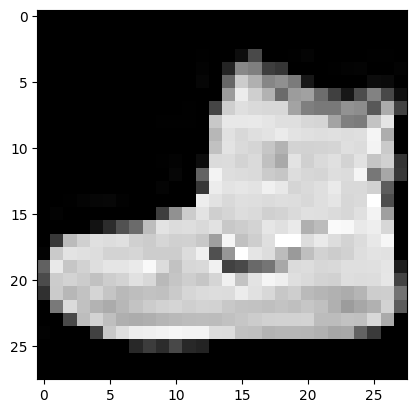

In [83]:
plt.imshow(image.squeeze(),cmap='gray'), image.shape

In [84]:
# directly pass image in the model
model_2(image)

torch.Size([10, 14, 14])
torch.Size([10, 7, 7])


RuntimeError: mat1 and mat2 shapes cannot be multiplied (10x49 and 0x10)

In [85]:
rand_image_tensor = torch.randn(size=(1,28,28))
rand_image_tensor.shape

torch.Size([1, 28, 28])

In [86]:
# let's try prediction now

model_2(rand_image_tensor) # it directly works in this and newer version of pytorch. No need to unsqueeze it. Here chala nhi since, hidden layer 0 kra hua hai, intentionally

torch.Size([10, 14, 14])
torch.Size([10, 7, 7])


RuntimeError: mat1 and mat2 shapes cannot be multiplied (10x49 and 0x10)

In [87]:
model_2(rand_image_tensor.unsqueeze(0)) # to make in form of batch used unsqueeze

torch.Size([1, 10, 14, 14])
torch.Size([1, 10, 7, 7])


RuntimeError: mat1 and mat2 shapes cannot be multiplied (1x490 and 0x10)

torch.Size([1, 10, 7, 7])  : this is the input size in the classification layer. But dena hoga 10 x 7 x 7 ; leaving 1; we don't actually have to pass batch size in the product.

Let's update the nodes in classification layer, because of the help of random tensor and running the code.

10 x 7 x 7 : channels_count x (output shape of 2nd conv block)

In [88]:
import torch
from torch import nn

# Create a convolutional neural network
class FashionMNISTModelV2(nn.Module):
  """
  Model architecture that replicates the TinyVGG
  Model from CNN explainer website.
  """
  def __init__(self, input_shape:int, hidden_units:int,output_shape:int):
    super().__init__()
    self.conv_block_1 = nn.Sequential(
        # create a conv2d layer
        nn.Conv2d(in_channels=input_shape,
                  out_channels=hidden_units,
                  kernel_size=3,
                  stride=1,
                  padding=1), # HYPERPARAMETERS : All of them
        nn.ReLU(),
        nn.Conv2d(in_channels=hidden_units,
                  out_channels=hidden_units,
                  kernel_size=3,
                  stride=1,
                  padding=1),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=2) # 2*2 max pool => 60*60 image will become 30*30 image
    )
    self.conv_block_2 = nn.Sequential(
        nn.Conv2d(in_channels=hidden_units,
                  out_channels=hidden_units,
                  kernel_size=3,
                  stride=1,
                  padding=1),
        nn.ReLU(),
        nn.Conv2d(in_channels=hidden_units,
                  out_channels=hidden_units,
                  kernel_size=3,
                  stride=1,
                  padding=1),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=2)
    )

    ## So these above convolutional layers with pooling layers are kind of feature extraction layers and trying to learn the patterns that best represent the data.

    # Now classification layers
    self.classifier = nn.Sequential(
        nn.Flatten(),
        nn.Linear(in_features=hidden_units*7*7, # [1 10 7 7] aayi thi output tensor shape, but yhan keval 10*7*7 lena hoga, batch_size nhi dena, trick me ye dhyan rkhna
                  out_features=output_shape)
    )

  def forward(self, x):
    x = self.conv_block_1(x)
    # print(x.shape) # this is the trick to determine the shape, when passing random sample : output [1,10,14,14]
    x = self.conv_block_2(x)
    # print(x.shape) # this is the trick to determine the shape, to be passed in the classification layer, when passing random sample. output : [1, 10, 7, 7]
    x = self.classifier(x)
    return x
    # once shape determined, comment out print statement

In [89]:
torch.manual_seed(42)
model_2 = FashionMNISTModelV2(input_shape=1,# input_shape = number of color channels. Since fashionmnist is grayscale, hence only one channel.
                              hidden_units = 10,
                              output_shape = len(class_names)
                              )

In [90]:
model_2(rand_image_tensor.unsqueeze(0))

tensor([[ 0.0360, -0.0848,  0.0659, -0.0406,  0.0093,  0.0363,  0.0045,  0.0021,
          0.0054, -0.0101]], grad_fn=<AddmmBackward0>)

But the good thing is, it has predicted probability of all the 10 classes for the model, before training, just by using random weights. Provided all the shapes and device matches

In [92]:
model_2(rand_image_tensor) # see conversion in batch is must. Nhi to error aa rhi hai.
## since we have created our model in such a way that input me batch of images pass krana hai. Chahe batch size 1 hi kyon na ho, direct image nhi pass krani.
# direct image pass krane ke liye, classification layer me input shape ko accordingly adjust krna hoga

RuntimeError: mat1 and mat2 shapes cannot be multiplied (10x49 and 490x10)

**Let's now train our first convolutions neural network.**

In [93]:
# Setup loss function/eval metrics/optimizer

from helper_functions import accuracy_fn

loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(params=model_2.parameters(), lr=0.1)

## Training and testing `model_2` using our training and testing step functions

In [94]:
torch.manual_seed(42)
torch.cuda.manual_seed(42)

# Measure time
from timeit import default_timer as timer
train_time_start_model_2 = timer()

# Train and test model
epochs = 3
for epoch in tqdm(range(epochs)):
  print(f"Epoch: {epoch}\n------")
  train_step(model = model_2,
             data_loader=train_dataloader,
             loss_fn = loss_fn,
             optimizer = optimizer,
             accuracy_fn = accuracy_fn,
             device = device)
  test_step(model = model_2,
            data_loader = test_dataloader,
            loss_fn = loss_fn,
            accuracy_fn = accuracy_fn,
            device = device)

train_time_end_model_2 = timer()
total_train_time_model_2 = print_train_time(start = train_time_start_model_2,
                                            end = train_time_end_model_2,
                                            device = device)

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 0
------
Looked at 0/60000 samples.
Looked at 12800/60000 samples.
Looked at 25600/60000 samples.
Looked at 38400/60000 samples.
Looked at 51200/60000 samples.
Train loss: 0.59518 | Train acc: 78.38 %
Test loss: 0.39500 | test acc : 85.99 % 

Epoch: 1
------
Looked at 0/60000 samples.
Looked at 12800/60000 samples.
Looked at 25600/60000 samples.
Looked at 38400/60000 samples.
Looked at 51200/60000 samples.
Train loss: 0.36536 | Train acc: 86.90 %
Test loss: 0.35244 | test acc : 86.91 % 

Epoch: 2
------
Looked at 0/60000 samples.
Looked at 12800/60000 samples.
Looked at 25600/60000 samples.
Looked at 38400/60000 samples.
Looked at 51200/60000 samples.
Train loss: 0.32588 | Train acc: 88.13 %
Test loss: 0.32719 | test acc : 88.07 % 

Train time on cpu:  213.310 seconds


So adding convolution layer has improved the accuracy.

In [95]:
# Get model_2 results
model_2_results = eval_model(
    model = model_2,
    data_loader = test_dataloader,
    loss_fn = loss_fn,
    accuracy_fn = accuracy_fn,
    device = device
)

  0%|          | 0/313 [00:00<?, ?it/s]

In [96]:
model_2_results

{'model_name': 'FashionMNISTModelV2',
 'model_loss': 0.32718968391418457,
 'model_acc': 88.06908945686901}

## Comparing results of our modelling experiments.

In [97]:
import pandas as pd
compare_results = pd.DataFrame([model_0_results,
                                model_1_results,
                                model_2_results])
compare_results

,model_name,model_loss,model_acc
0,FashionMNISTModelV0,0.476639,83.426518
1,FashionMNISTModelV1,0.685001,75.019968
2,FashionMNISTModelV2,0.327190,88.069089


model_2 simple ann me non-linearity ghusane se bana tha, Model 1 pure ann tha. model 3, ann + cnn(with non-linearity) hai.

In [98]:
# add training time to result comparison
compare_results['training_time']=[total_train_time_model_0,
                                  total_train_time_model_1,
                                  total_train_time_model_2]
compare_results

,model_name,model_loss,model_acc,training_time
0,FashionMNISTModelV0,0.476639,83.426518,37.380007
1,FashionMNISTModelV1,0.685001,75.019968,42.688328
2,FashionMNISTModelV2,0.327190,88.069089,213.310402


all are in cpu

Text(0, 0.5, 'model')

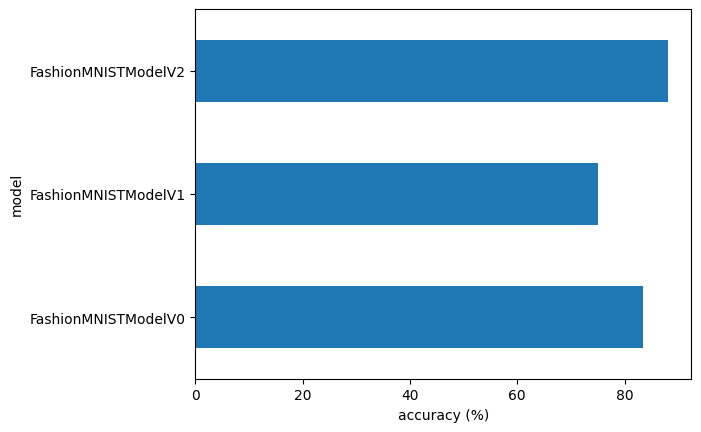

In [99]:
# visualize our model results
# fastest way to create a bar chart: df.set_index('name of column of independent variable')["name of column of corresponding dependent variable"].plot(kind="bar type")
compare_results.set_index("model_name")["model_acc"].plot(kind="barh") # see the above dataframe
plt.xlabel("accuracy (%)")
plt.ylabel("model")

## Make and evaluate random predictions with best model

In [100]:
def make_predictions(model : torch.nn.Module,
                     data: list,
                     device : torch.device = device):
  pred_probs = []
  model.to(device)
  model.eval()
  with torch.inference_mode():
    for sample in data:
      # prepare the sample
      sample = torch.unsqueeze(sample, dim=0).to(device)

      # forward pass(model output raw logits)
      pred_logits = model(sample)

      # get prediction probanility (logit -> prediction probability)
      pred_prob = torch.softmax(pred_logits.squeeze(), dim=0)

      # Get pred_prob off the gpu for further calculation
      pred_probs.append(pred_prob.cpu())

  # stack the pred_probs to turn list into a tensor
  return torch.stack(pred_probs)


In [101]:
import random
random.seed(42)

test_samples = []
test_labels = []

for sample, label in random.sample(list(test_data), k=9): # 9 random samples will be taken in (sample,label) pair
  test_samples.append(sample)
  test_labels.append(label)

# view the first sample shape
test_samples[0].shape

torch.Size([1, 28, 28])

Text(0.5, 1.0, 'Sandal')

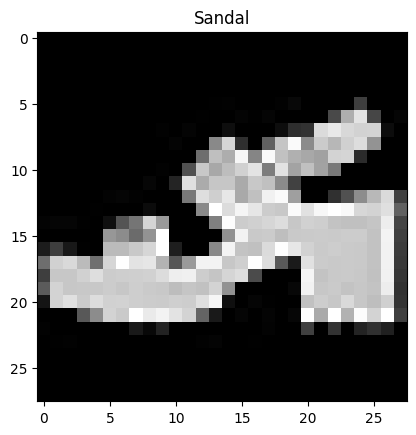

In [102]:
plt.imshow(test_samples[0].squeeze(), cmap="gray")
plt.title(class_names[test_labels[0]])

In [103]:
# making prediction on the 9 randomly picked samples.
pred_probs = make_predictions(model = model_2,
                             data = test_samples)

# View first two prediction probabilities
pred_probs[:2]

tensor([[1.4021e-06, 1.7343e-07, 4.4511e-07, 1.2103e-05, 5.4026e-07, 9.9938e-01,
         3.7154e-06, 2.1650e-04, 1.4199e-04, 2.4416e-04],
        [1.0080e-01, 5.6287e-01, 7.4506e-04, 1.1212e-01, 6.3881e-02, 3.0674e-04,
         1.5560e-01, 1.6463e-03, 1.0169e-03, 1.0133e-03]])

In [104]:
# Convert prediction probabilities to labels

pred_classes = pred_probs.argmax(dim=1)
pred_classes

tensor([5, 1, 7, 4, 3, 0, 4, 7, 1])

In [105]:
test_labels

[5, 1, 7, 4, 3, 0, 4, 7, 1]

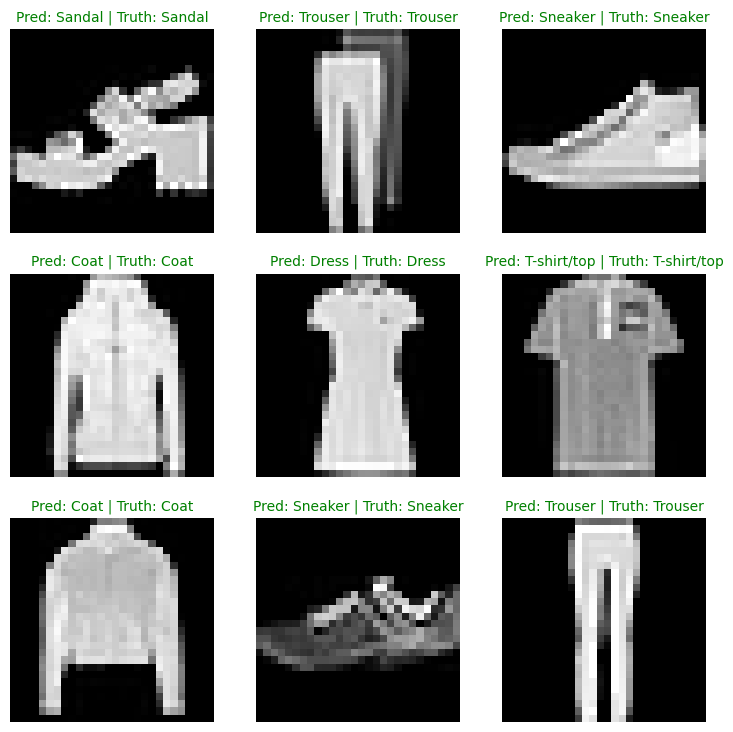

In [106]:
# Plotting 9 different samples along with their original labels and model predictions

plt.figure(figsize=(9,9))
nrow = 3
ncol = 3
for i, sample in enumerate(test_samples):
  # create subplot
  plt.subplot(nrow, ncol, i+1)

  # plot the target image
  plt.imshow(sample.squeeze(), cmap="gray")

  # find the predictions in text form eg "sandal"
  pred_label = class_names[pred_classes[i]]

  # get the truth label in text form
  truth_label = class_names[test_labels[i]]

  # create a title for the plot
  title_text = f"Pred: {pred_label} | Truth: {truth_label}"

  # chec the equality between pred and truth and change color of title text
  if pred_label == truth_label:
    plt.title(title_text, fontsize=10, c='g') # green text if prediction same as truth
  else:
    plt.title(title_text, fontsize=10, c='r')

  plt.axis(False)

 ## Making predictions across the whole test datasets and importing liraries to plot a confusion matrix

# making a confusion matrix for further prediction evaluation

A confusion matrix is a fantastic way of evaluating your classification models visually.

1. Make predictions with our trained model on the test dataset
2. Make a confusion matrix `torchmetrics.ConfusionMatrix`
3. Plot the confusion matrix using `mlxtend.plotting.plot_confusion_matrix()`

In [107]:
import mlxtend

In [108]:
mlxtend.__version__

'0.22.0'

In [109]:
# import tqdm.auto
from tqdm.auto import tqdm

# 1. Make predictions with trained_model
y_preds = []
model_2.eval()
with torch.inference_mode():
  for X, y in tqdm(test_dataloader, desc="Making predictions.."):
    # send the data and targets to the target device
    X, y = X.to(device), y.to(device)
    # Do the forward pass
    y_logit = model_2(X)
    # Turn predictions from logits -> prediction probabilities -> prediction labels
    y_pred = torch.softmax(y_logit.squeeze(), dim=0).argmax(dim=1)
    # Put predictions on CPU for evaluation
    y_preds.append(y_pred.cpu())

# Concatenate list of predictions into a tensor
# print(y_preds)
y_pred_tensor = torch.cat(y_preds)
y_pred_tensor

Making predictions..:   0%|          | 0/313 [00:00<?, ?it/s]

tensor([9, 2, 1,  ..., 8, 1, 8])

In [110]:
## see if required packages are installed, if not , install them .... : na samjh aaya, chhod do ise bhai
try:
    import torchmetrics
    import mlxtend
    print(f"mlxtend_version: {mlxtend.__version__}")
    assert int(mlxtend.__version__.split(".")[1]) >= 22, "mlxtend version should be 0.19 or higher"
except ImportError:
    # If the required packages are not installed, install them
    !pip install torchmetrics mlxtend

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 840.4/840.4 kB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 14.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 16.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 18.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 663.9 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 10.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 10.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.2/124.2 MB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.0/196.0 MB 2.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 166.0/166.0 MB 2.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.1/99.1 kB 11.6 MB/s eta 0:00:00
     ━━━━━━━━━━━

In [111]:
len(y_pred_tensor)

10000

In [112]:
import mlxtend
print(mlxtend.__version__)

0.22.0


In [113]:
test_data.targets

tensor([9, 2, 1,  ..., 8, 1, 5])

In [114]:
## Evaluating model's predictions with a confusion matrix
from torchmetrics import ConfusionMatrix
from mlxtend.plotting import plot_confusion_matrix

# 2. setup confusion instance and compare predictions to targets
confmat = ConfusionMatrix(num_classes=len(class_names),task='multiclass')
confmat_tensor = confmat(preds=y_pred_tensor,
                         target=test_data.targets)


In [115]:
confmat_tensor

tensor([[628,   5,  44,  79,  12,   1, 224,   0,   7,   0],
        [  8, 895,   7,  68,  13,   0,   5,   0,   3,   1],
        [  7,   1, 810,  13,  95,   0,  69,   0,   5,   0],
        [ 25,  13,  25, 861,  36,   0,  34,   0,   4,   2],
        [  5,   6, 117,  50, 712,   0, 106,   0,   4,   0],
        [  6,   0,   9,  11,   0, 840,   4,  44,  66,  20],
        [ 69,   7, 123,  64,  98,   0, 626,   0,  13,   0],
        [  1,   1,   0,   1,   0,  33,   0, 877,  18,  69],
        [  8,   2,  23,  17,   6,   7,  29,   7, 900,   1],
        [  1,   0,   1,   2,   0,  20,   4,  71,  11, 890]])

More good looking code:

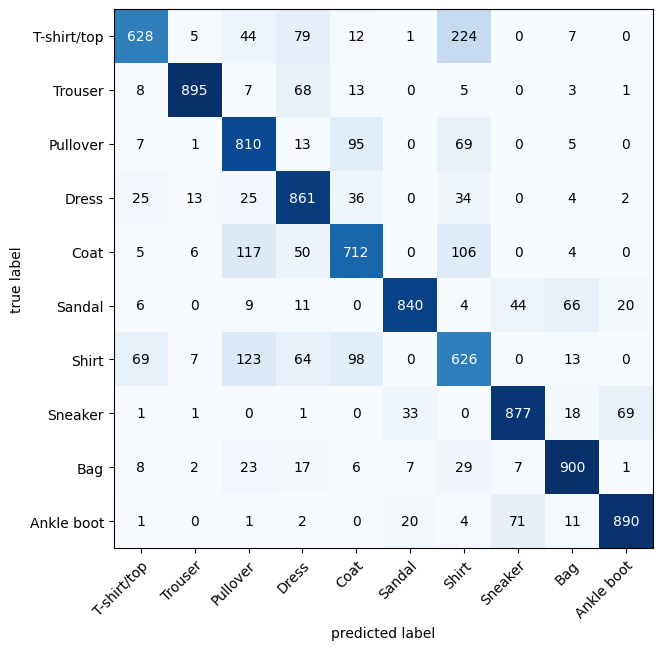

In [116]:
## Evaluating model's predictions with a confusion matrix
from torchmetrics import ConfusionMatrix
from mlxtend.plotting import plot_confusion_matrix

# 2. setup confusion instance and compare predictions to targets
confmat = ConfusionMatrix(num_classes=len(class_names),task='multiclass')
confmat_tensor = confmat(preds=y_pred_tensor,
                         target=test_data.targets)

# 3. plot the confusion matrix
fg, ax = plot_confusion_matrix(
    conf_mat = confmat_tensor.numpy(), # matplotlib likes working with numpy
    class_names = class_names,
    figsize=(10,7)
)

All the values on principle diagonal are correct.

Check shirt and t-shirt confussion of model. It is clearly visible by confusion matrix. Similar is for in pullover and shirt.

## DOING EVERYTHING IN ONE CODE and CUDA or GPU DEVICE.

2.2.1+cu121
0.17.1+cu121


100%|██████████| 26421880/26421880 [00:01<00:00, 15474382.13it/s]


Extracting data/FashionMNIST/raw/train-images-idx3-ubyte.gz to data/FashionMNIST/raw



100%|██████████| 29515/29515 [00:00<00:00, 267338.60it/s]


Extracting data/FashionMNIST/raw/train-labels-idx1-ubyte.gz to data/FashionMNIST/raw



100%|██████████| 4422102/4422102 [00:00<00:00, 4859318.61it/s]


Extracting data/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to data/FashionMNIST/raw



100%|██████████| 5148/5148 [00:00<00:00, 5820020.75it/s]


Extracting data/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to data/FashionMNIST/raw



  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 0
------
Looked at 0/60000 samples.
Looked at 12800/60000 samples.
Looked at 25600/60000 samples.
Looked at 38400/60000 samples.
Looked at 51200/60000 samples.
Train loss: 0.59525 | Train acc: 78.37 %
Test loss: 0.40363 | test acc : 85.41 % 

Epoch: 1
------
Looked at 0/60000 samples.
Looked at 12800/60000 samples.
Looked at 25600/60000 samples.
Looked at 38400/60000 samples.
Looked at 51200/60000 samples.
Train loss: 0.36098 | Train acc: 86.99 %
Test loss: 0.35508 | test acc : 86.95 % 

Epoch: 2
------
Looked at 0/60000 samples.
Looked at 12800/60000 samples.
Looked at 25600/60000 samples.
Looked at 38400/60000 samples.
Looked at 51200/60000 samples.
Train loss: 0.32204 | Train acc: 88.38 %
Test loss: 0.32526 | test acc : 88.17 % 

Train time on cuda: 36.641 seconds


Making predictions..:   0%|          | 0/313 [00:00<?, ?it/s]

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 840.4/840.4 kB 4.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 41.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 60.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 53.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.2/124.2 MB 6.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.0/196.0 MB 4.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 166.0/166.0 MB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.1/99.1 kB 14.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━

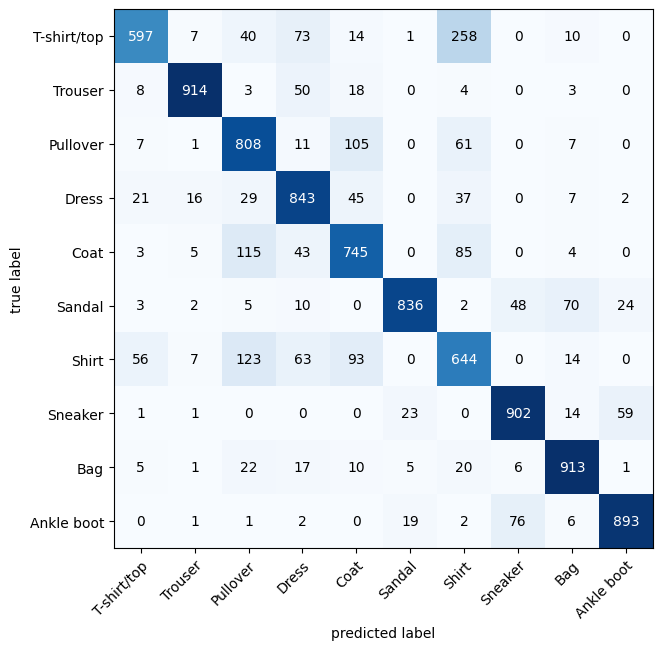

In [1]:
# Import PyTorch
import torch
from torch import nn

# Import torchvision
import torchvision
from torchvision import datasets
from torchvision import transforms
from torchvision.transforms import ToTensor

# Import Matplotlib for visualization
import matplotlib.pyplot as plt

# Check version
print(torch.__version__)
print(torchvision.__version__)


# Setup training data
from torchvision import datasets
train_data = datasets.FashionMNIST(
    root="data",# where to download data?
    train = True, # Do we want the training data?
    download=True, #  do we want to download yes/no?,
    transform=torchvision.transforms.ToTensor(), # how do we transform the data?
    target_transform = None # do we want to transform the labels/targets?
)

test_data = datasets.FashionMNIST(
    root = "data",
    train = False,
    download = True,
    transform = ToTensor(), # same as torchvision.transforms.ToTensor()
    target_transform = None
)


class_names = train_data.classes


from torch.utils.data import DataLoader

# Setup the batch size hyperparameter
BATCH_SIZE = 32

# Turn dataset into iterables (batches)
train_dataloader = DataLoader(dataset=train_data, batch_size=BATCH_SIZE, shuffle=True)

test_dataloader = DataLoader(dataset=test_data, batch_size=BATCH_SIZE, shuffle=False)


# Calculate accuracy (a classification metric)
def accuracy_fn(y_true, y_pred):
  correct = torch.eq(y_true, y_pred).sum().item() # torch.eq() calculates where two tensors are equal
  acc = (correct/len(y_pred))*100
  return acc

# to import some function from another python files
import requests
from pathlib import Path

# Download helper function from learn pytorch repo
if Path("helper_functions.py").is_file():
  print("helper_function.py already exists, skipping download...")
else: # copy raw url, only; not the one first comes
  print("Downloading helper_function.py")
  request = requests.get("https://raw.githubusercontent.com/mrdbourke/pytorch-deep-learning/main/helper_functions.py")
  with open("helper_functions.py", "wb") as f:
    f.write(request.content)

device = "cuda" if torch.cuda.is_available() else "cpu"

def train_step(model: torch.nn.Module,
               data_loader: torch.utils.data.DataLoader,
               loss_fn: torch.nn.Module,
               optimizer: torch.optim.Optimizer,
               accuracy_fn,
               device: torch.device=device):
  """performs a training with model trying to learn on data_loader"""
  train_loss, train_acc = 0, 0

  # put the model into training mode
  model.train()

  # Add a loop through the training batches
  for batch, (X,y) in enumerate(data_loader):
    # Put the data on target device
    X, y = X.to(device), y.to(device)

    # 1. Forward pass : output the raw logits from the model
    y_pred = model(X)

    # 2. calculate loss and accuracy per batch
    loss = loss_fn(y_pred, y)
    train_loss += loss # accumulate train loss
    train_acc += accuracy_fn(y_true=y, y_pred=y_pred.argmax(dim=1)) # go from logits to prediction labels

    # 3. Optimizer zero grad
    optimizer.zero_grad()

    # 4. loss backward
    loss.backward()

    # 5. optimizer step (update the model's parameter once per batch)
    optimizer.step()

    # Print out what is happening
    if batch % 400 == 0:
      print(f"Looked at {batch*len(X)}/{len(data_loader.dataset)} samples.") # remember it is not division, it is just string since {} nhi lga variable ke age

  # devide total train loss and accuracy by length of the dataloader(i.e. the number of batches) to get avegage loss and average accuracy per batch
  train_loss /= len(data_loader)
  train_acc /= len(data_loader)
  print(f"Train loss: {train_loss:.5f} | Train acc: {train_acc:.2f} %")


def test_step(model:torch.nn.Module,
              data_loader: torch.utils.data.DataLoader,
              loss_fn: torch.nn.Module,
              accuracy_fn,
              device: torch.device=device):
  """Perform a testing loop step on the model going over data_loader"""
  test_loss, test_acc = 0, 0

  # Put the model in eval mode
  model.eval()

  # Turn on inference mode context manager
  with torch.inference_mode():
    for X_test, y_test in data_loader:
      # send data to the target device
      X_test, y_test = X_test.to(device), y_test.to(device)

      # 1. Forward pass
      test_pred = model(X_test)

      # 2. calculate the loss/acc
      test_loss += loss_fn(test_pred, y_test)
      test_acc += accuracy_fn(y_true=y_test, y_pred=test_pred.argmax(dim=1)) # go from logits to prediction labels

    # Adjust metrics and print out
    test_loss /= len(data_loader) # avg test loss per batch
    test_acc /= len(data_loader) # avg test accuracy per batch
    print(f"Test loss: {test_loss:.5f} | test acc : {test_acc:.2f} % \n")


import torch
from torch import nn

# Create a convolutional neural network
class FashionMNISTModelV2(nn.Module):
  """
  Model architecture that replicates the TinyVGG
  Model from CNN explainer website.
  """
  def __init__(self, input_shape:int, hidden_units:int,output_shape:int):
    super().__init__()
    self.conv_block_1 = nn.Sequential(
        # create a conv2d layer
        nn.Conv2d(in_channels=input_shape,
                  out_channels=hidden_units,
                  kernel_size=3,
                  stride=1,
                  padding=1), # HYPERPARAMETERS : All of them
        nn.ReLU(),
        nn.Conv2d(in_channels=hidden_units,
                  out_channels=hidden_units,
                  kernel_size=3,
                  stride=1,
                  padding=1),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=2) # 2*2 max pool => 60*60 image will become 30*30 image
    )
    self.conv_block_2 = nn.Sequential(
        nn.Conv2d(in_channels=hidden_units,
                  out_channels=hidden_units,
                  kernel_size=3,
                  stride=1,
                  padding=1),
        nn.ReLU(),
        nn.Conv2d(in_channels=hidden_units,
                  out_channels=hidden_units,
                  kernel_size=3,
                  stride=1,
                  padding=1),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=2)
    )

    ## So these above convolutional layers with pooling layers are kind of feature extraction layers and trying to learn the patterns that best represent the data.

    # Now classification layers
    self.classifier = nn.Sequential(
        nn.Flatten(),
        nn.Linear(in_features=hidden_units*7*7, # there is a trick to calculate this
                  out_features=output_shape)
    )

  def forward(self, x):
    x = self.conv_block_1(x)
    # print(x.shape)
    x = self.conv_block_2(x)
    # print(x.shape)
    x = self.classifier(x)
    return x

torch.manual_seed(42)
model_2 = FashionMNISTModelV2(input_shape=1,# input_shape = number of color channels. Since fashionmnist is grayscale, hence only one channel.
                              hidden_units = 10,
                              output_shape = len(class_names)
                              )

# Move the model to the appropriate device (CPU or GPU)
model_2.to(device)

from timeit import default_timer as timer
def print_train_time(start: float, end: float, device: torch.device = None):
    """Prints difference between start and end time.

    Args:
        start (float): Start time of computation (preferred in timeit format).
        end (float): End time of computation.
        device ([type], optional): Device that compute is running on. Defaults to None.

    Returns:
        float: time between start and end in seconds (higher is longer).
    """
    total_time = end - start
    print(f"Train time on {device}: {total_time:.3f} seconds")
    return total_time


# Setup loss function/eval metrics/optimizer

from helper_functions import accuracy_fn

loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(params=model_2.parameters(), lr=0.1)

torch.manual_seed(42)
torch.cuda.manual_seed(42)

# Measure time
from timeit import default_timer as timer
train_time_start_model_2 = timer()

# import tqdm.auto
from tqdm.auto import tqdm


# Train and test model
epochs = 3
for epoch in tqdm(range(epochs)):
  print(f"Epoch: {epoch}\n------")
  train_step(model = model_2,
             data_loader=train_dataloader,
             loss_fn = loss_fn,
             optimizer = optimizer,
             accuracy_fn = accuracy_fn,
             device = device)
  test_step(model = model_2,
            data_loader = test_dataloader,
            loss_fn = loss_fn,
            accuracy_fn = accuracy_fn,
            device = device)

train_time_end_model_2 = timer()
total_train_time_model_2 = print_train_time(start = train_time_start_model_2,
                                            end = train_time_end_model_2,
                                            device = device)


def eval_model(model: torch.nn.Module,
               data_loader: torch.utils.data.DataLoader,
               loss_fn: torch.nn.Module,
               accuracy_fn,
               device: torch.device = device):
    """Evaluates a given model on a given dataset.

    Args:
        model (torch.nn.Module): A PyTorch model capable of making predictions on data_loader.
        data_loader (torch.utils.data.DataLoader): The target dataset to predict on.
        loss_fn (torch.nn.Module): The loss function of model.
        accuracy_fn: An accuracy function to compare the models predictions to the truth labels.
        device (str, optional): Target device to compute on. Defaults to device.

    Returns:
        (dict): Results of model making predictions on data_loader.
    """
    loss, acc = 0, 0
    model.eval()
    with torch.inference_mode():
        for X, y in data_loader:
            # Send data to the target device
            X, y = X.to(device), y.to(device)
            y_pred = model(X)
            loss += loss_fn(y_pred, y)
            acc += accuracy_fn(y_true=y, y_pred=y_pred.argmax(dim=1))

        # Scale loss and acc
        loss /= len(data_loader)
        acc /= len(data_loader)
    return {"model_name": model.__class__.__name__, # only works when model was created with a class
            "model_loss": loss.item(),
            "model_acc": acc}

# Get model_2 results
model_2_results = eval_model(
    model = model_2,
    data_loader = test_dataloader,
    loss_fn = loss_fn,
    accuracy_fn = accuracy_fn,
    device = device
)


# 1. Make predictions with trained_model
y_preds = []
model_2.eval()
with torch.inference_mode():
  for X, y in tqdm(test_dataloader, desc="Making predictions.."):
    # send the data and targets to the target device
    X, y = X.to(device), y.to(device)
    # Do the forward pass
    y_logit = model_2(X)
    # Turn predictions from logits -> prediction probabilities -> prediction labels
    y_pred = torch.softmax(y_logit.squeeze(), dim=0).argmax(dim=1)
    # Put predictions on CPU for evaluation
    y_preds.append(y_pred.cpu())

# Concatenate list of predictions into a tensor
# print(y_preds)
y_pred_tensor = torch.cat(y_preds)


## Evaluating model's predictions with a confusion matrix
!pip install torchmetrics mlxtend
import torchmetrics, mlxtend
from torchmetrics import ConfusionMatrix
from mlxtend.plotting import plot_confusion_matrix

# 2. setup confusion instance and compare predictions to targets
confmat = ConfusionMatrix(num_classes=len(class_names),task='multiclass')
confmat_tensor = confmat(preds=y_pred_tensor,
                         target=test_data.targets)

# 3. plot the confusion matrix
fg, ax = plot_confusion_matrix(
    conf_mat = confmat_tensor.numpy(), # matplotlib likes working with numpy
    class_names = class_names,
    figsize=(10,7)
)

## Saving and reloading trained model.

In [2]:
from pathlib import Path

# create model directory path
MODEL_PATH = Path("models")
MODEL_PATH.mkdir(parents = True,
                 exist_ok = True)

# Create model save
MODEL_NAME = "03_pytorch_computer_vision_model_2.pth"
MODEL_SAVE_PATH = MODEL_PATH / MODEL_NAME

MODEL_SAVE_PATH

PosixPath('models/03_pytorch_computer_vision_model_2.pth')

In [3]:
from pathlib import Path

# Create models directory (if it doesn't already exist), see: https://docs.python.org/3/library/pathlib.html#pathlib.Path.mkdir
MODEL_PATH = Path("models")
MODEL_PATH.mkdir(parents=True, # create parent directories if needed
                 exist_ok=True # if models directory already exists, don't error
)

# Create model save path
MODEL_NAME = "03_pytorch_computer_vision_model_2.pth"
MODEL_SAVE_PATH = MODEL_PATH / MODEL_NAME

# Save the model state dict
print(f"Saving model to: {MODEL_SAVE_PATH}")
torch.save(obj=model_2.state_dict(), # only saving the state_dict() only saves the learned parameters
           f=MODEL_SAVE_PATH)

Saving model to: models/03_pytorch_computer_vision_model_2.pth


Since saved just parameters. Need to create a new instance of exactly same archetechture to superimpose the parameter values on the new instance.

In [4]:
# create a new instance
torch.manual_seed(42)

loaded_model_2 = FashionMNISTModelV2(input_shape = 1,
                                    hidden_units = 10,
                                    output_shape = len(class_names))

# Load in the same state dict
loaded_model_2.load_state_dict(torch.load(f=MODEL_SAVE_PATH))

# SEND THE MODELTO TARGET DEVICE
loaded_model_2.to(device)

FashionMNISTModelV2(
  (conv_block_1): Sequential(
    (0): Conv2d(1, 10, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(10, 10, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU()
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (conv_block_2): Sequential(
    (0): Conv2d(10, 10, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(10, 10, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU()
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (classifier): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=490, out_features=10, bias=True)
  )
)

In [5]:
model_2_results

{'model_name': 'FashionMNISTModelV2',
 'model_loss': 0.3252636194229126,
 'model_acc': 88.16892971246007}

In [6]:
# Evaluate the loaded model
torch.manual_seed(42)

loaded_model_2_results = eval_model(
    model = loaded_model_2,
    data_loader = test_dataloader,
    loss_fn = loss_fn,
    accuracy_fn=accuracy_fn
)

loaded_model_2_results

{'model_name': 'FashionMNISTModelV2',
 'model_loss': 0.3252636194229126,
 'model_acc': 88.16892971246007}

In [7]:
model_2_results

{'model_name': 'FashionMNISTModelV2',
 'model_loss': 0.3252636194229126,
 'model_acc': 88.16892971246007}

In [8]:
# check if model results are close to each other
torch.isclose(torch.tensor(model_2_results["model_loss"]),
              torch.tensor(loaded_model_2_results["model_loss"]))

tensor(True)

FINALLY 12650 REACHED BALHARSHAH.

NOW LAST NON-STOP JOURNEY BALHARSHAH TO KACHEGUDA..